<a href="https://colab.research.google.com/github/PPierzc/PracowniaEEG/blob/master/Cw2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st
import copy
import tqdm
import itertools
import seaborn as sns
import os

!pip install obci_readmanager
from obci_readmanager.signal_processing.read_manager import ReadManager

    100% |████████████████████████████████| 61kB 3.7MB/s 


# Analiza Modeli

### Signal Constructor Functions


---


In [0]:
params = {
'T': 1,
'Fs': 128,
't0' : 0.3,
'sigma' : .02,
}

#### Sin

In [0]:
def sin(f = 1, T = 1, Fs = 128, phi =0, **kwargs):
 
	dt = 1.0/Fs
	x = np.arange(0,T,dt)
	g = np.sin(2*np.pi*f*x + phi)
	return x, g

#### G_1

In [0]:
def  g_1(t0=0, sigma=1, Fs=128, T=1):
#   x = np.arange(0, T, 1/Fs)
#   g = st.norm.pdf(x, loc=t0, scale=sigma)
#   return x, g

  x = np.arange(0, T, 1/Fs)
  g = np.empty(len(x))
  for i,dt in enumerate(x):
    
    g[i] = np.exp(-.5 * (dt - t0)* (dt - t0) / (sigma*sigma) )
    
  return x, g

#### G_2

In [0]:
def g_2(t0=0, sigma=1, Fs=128, T=1):
  
  '''acording to : https://www.wolframalpha.com/input/?i=d%2Fdt+e%5E(-(t-t0)%5E2%2F(2*s%5E2))'''
  x = np.arange(0, T, 1/Fs)
  g = np.empty(len(x))
  
  for i,dt in enumerate(x):
    g[i] = - (dt - t0) * np.exp(-.5 * (dt - t0)* (dt - t0) \
                                / (sigma*sigma) )/(sigma*sigma)
    
    
  return x, g

#### G_3

In [0]:
def g_3(t0=5, sigma=1, Fs=128, T=1):
  x, g = g_1(t0, sigma, Fs, T)
  g[np.where(x < t0)] = 0
  return x, g

#### Noise

In [0]:
def noise(T, Fs, **kwargs):
  x = np.arange(0, T, 1/Fs)
  g = np.random.randn(len(x))
  return x, g

#### Impulse

In [0]:
def impulse(length, x0 = None):
  impulse = np.zeros(length)
  
  if not x0:
    impulse[length // 2] = 1
  else:
    impulse[x0] = 1
    
  return impulse

#### Display Construction Functions

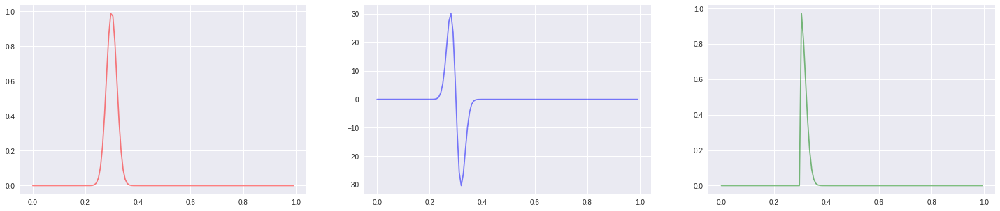

In [0]:
plt.figure(figsize=(25,5))
t,s = g_1(**params)
plt.subplot(1, 3, 1)
plt.plot(t,s, alpha=.5, c='r', label='g_1')

t,s = g_2(**params)
plt.subplot(1, 3, 2)
plt.plot(t,s, alpha=.5, c='b', label='g_2')

t,s = g_3(**params)
plt.subplot(1, 3, 3)
plt.plot(t,s, alpha=.5, c='g', label='g_3')

plt.show()


## Symulacje
---



### Sygnał + Szum

In [0]:
def symulacja(g, N, params):
  x, g = g(**params)
  sims = np.empty((N, len(x)))
  for i in range(N):
    x, g_noise = noise(**params)
    sims[i] = g + g_noise
  return np.var(np.mean(sims, axis=0)), np.var(sims, axis=0)
    

In [0]:
Ns = range(10, 5000, 10)
sims = np.empty((len(Ns)))
for i, N in enumerate(Ns):
  _s, _v = symulacja(g_1, N, params)
  sims[i] = _s

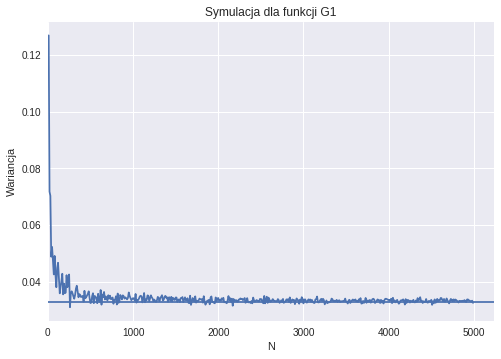

In [0]:
plt.plot(Ns, sims)
plt.axhline(np.var(g_1(**params)[1]))
# plt.axhline(0.0329358, c='r')
plt.xlim((0, None))
plt.title('Symulacja dla funkcji G1')
plt.xlabel('N')
plt.ylabel('Wariancja')
plt.show()

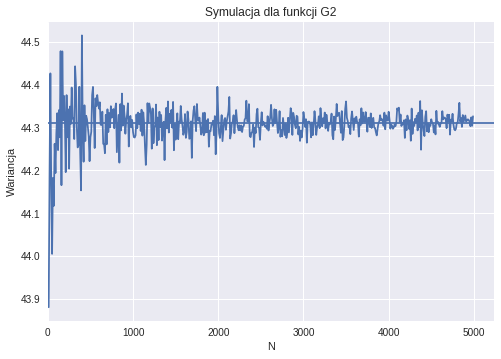

In [0]:
Ns = range(10, 5000, 10)
sims = np.empty((len(Ns)))
for i, N in enumerate(Ns):
  _s, _v = symulacja(g_2, N, params)
  sims[i] = _s
  
plt.plot(Ns, sims)
plt.axhline(np.var(g_2(**params)[1]))
plt.title('Symulacja dla funkcji G2')
plt.xlabel('N')
plt.ylabel('Wariancja')
plt.xlim((0, None))
plt.show()

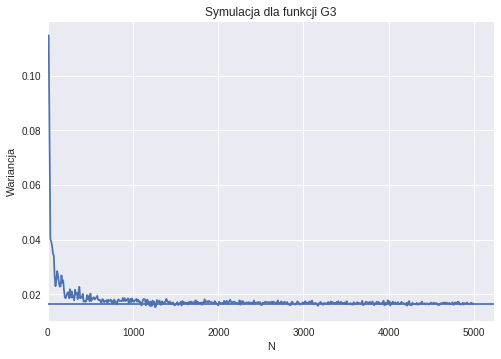

In [0]:
Ns = range(10, 5000, 10)
sims = np.empty((len(Ns)))
for i, N in enumerate(Ns):
  _s, _v = symulacja(g_3, N, params)
  sims[i] = _s
  
plt.plot(Ns, sims)
plt.axhline(np.var(g_3(**params)[1]))
plt.title('Symulacja dla funkcji G3')
plt.xlabel('N')
plt.ylabel('Wariancja')
plt.xlim((0, None))
plt.show()

### Sygnał + szum + niezależna czynność rytmiczna

wnioski(in nizsze czestosci tym one sie mniej wysrednia, malo powtorzen - duze skoki, wykresy spadaja jak 1/n wiec git)

In [0]:
def symulacja_sinus(g, N, f, params):
  x, g = g(**params)
  sims = np.empty((N, len(x)))
  for i in range(N):
    x, g_noise = noise(**params)
    x, g_sin = sin(
        phi=np.random.randint(-np.pi, np.pi),
        f=f,
        **params)
    sims[i] = g + g_noise + g_sin
  return np.var(np.mean(sims, axis=0)), np.var(sims, axis=0)

#### Dla G_1

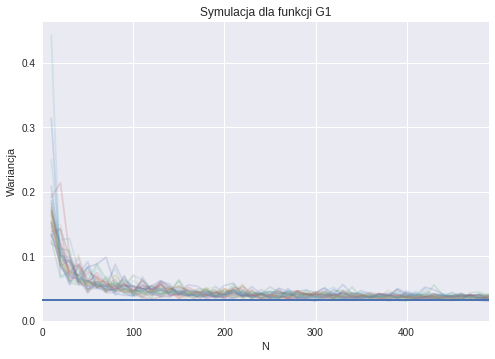

In [0]:
Ns = range(10, 500, 10)
for f in np.arange(5, 20, 0.5):
  sims = np.empty((len(Ns)))
  for i, N in enumerate(Ns):
    _s, _v = symulacja_sinus(g_1, N, f, params)
    sims[i] = _s
  
  plt.plot(Ns, sims, alpha=.2)
  plt.axhline(np.var(g_1(**params)[1]))
plt.xlim((0, max(Ns)))
plt.ylim(0, None)
plt.xlabel('N')
plt.ylabel('Wariancja')
plt.title('Symulacja dla funkcji G1')
plt.show()

#### Dla G_2

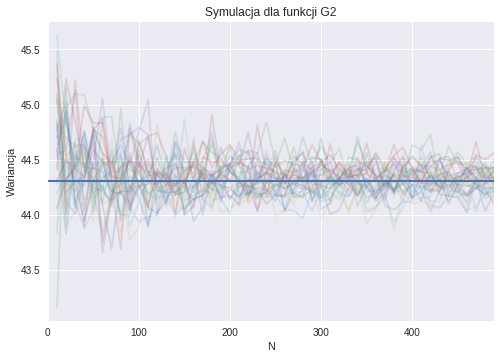

In [0]:
Ns = range(10, 500, 10)
for f in np.arange(5, 20, 0.5):
  sims = np.empty((len(Ns)))
  for i, N in enumerate(Ns):
    _s, _v = symulacja_sinus(g_2, N, f, params)
    sims[i] = _s
  
  plt.plot(Ns, sims, alpha=.2)
  plt.axhline(np.var(g_2(**params)[1]))
plt.xlim((0, max(Ns)))
plt.title('Symulacja dla funkcji G2')
plt.xlabel('N')
plt.ylabel('Wariancja')
plt.show()

#### Dla G_3

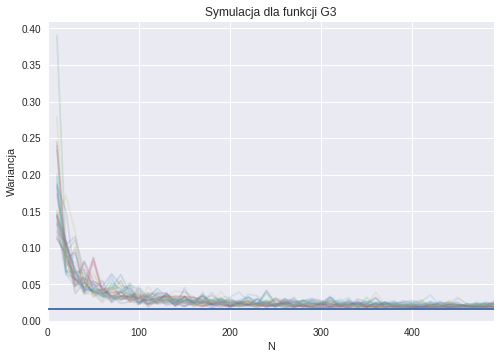

In [0]:
Ns = range(10, 500, 10)
for f in np.arange(5, 20, 0.5):
  sims = np.empty((len(Ns)))
  for i, N in enumerate(Ns):
    _s, _v = symulacja_sinus(g_3, N, f, params)
    sims[i] = _s
  
  plt.plot(Ns, sims, alpha=.2)
  plt.axhline(np.var(g_3(**params)[1]))
plt.xlim((0, max(Ns)))
plt.ylim(0, None)
plt.xlabel('N')
plt.ylabel('Wariancja')
plt.title('Symulacja dla funkcji G3')
plt.show()

### Uśrednianie w modelu z resetem fazy (wnioski:)



In [0]:
def sin_reset_phase(f):
  x = np.arange(0, 1, 1/128)
  s = np.empty(len(x))

  half = len(x)//2

  s[:half] = np.sin(2 * np.pi * f * x[:half] + np.random.normal(-np.pi, np.pi))
  s[half:] = np.sin(2 * np.pi * f * x[half:])
  
  return x, s

In [0]:
def get_mean_sin(N, scale):
  sins = np.empty((N, 128))
  x = np.arange(0, 1, 1/128)

  for i, f in enumerate(st.norm.rvs(loc=10, scale=scale, size=N)):
    sins[i] = sin_reset_phase(f)[1]
    
  return x, np.mean(sins, axis=0)

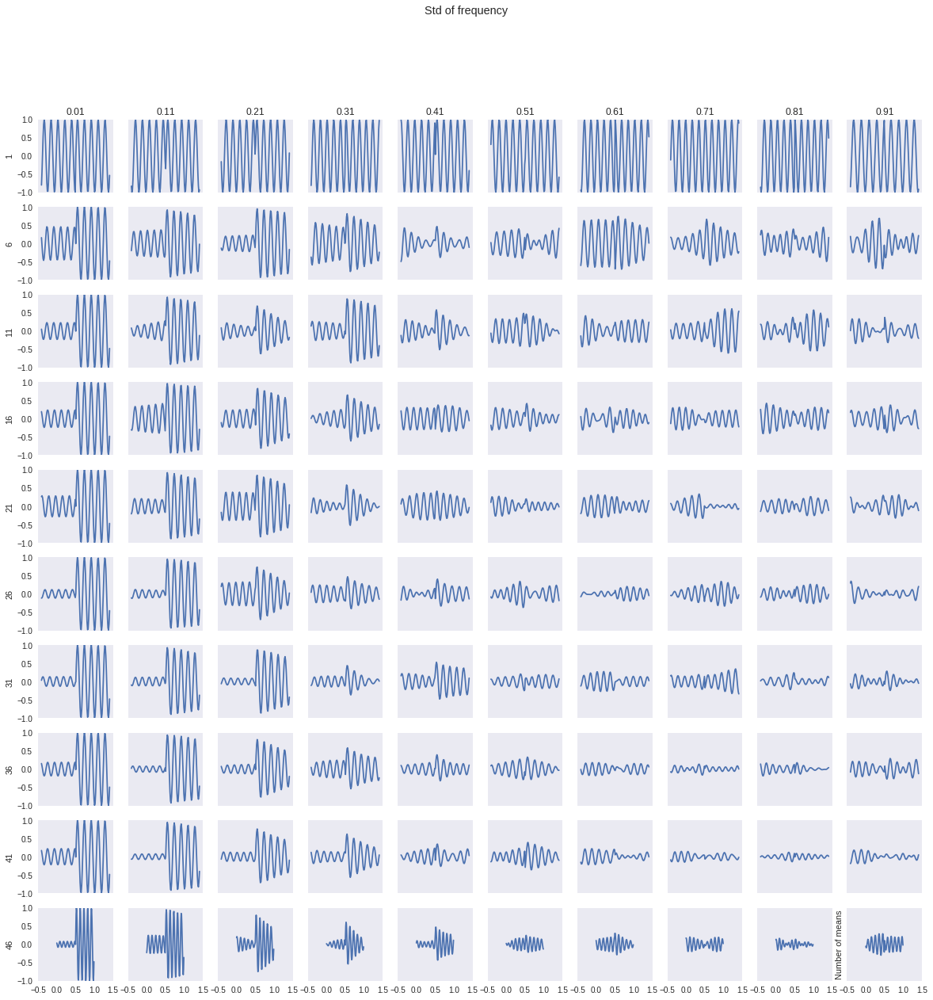

In [0]:
plt.figure(figsize=(20,20))
plt.tight_layout()
N = np.arange(1, 51, 5)
scale = np.arange(0.01, 1, 0.1)

for i, n in enumerate(N):
  for j, s in enumerate(scale):
    pos = (j+1) + (i*len(N))
    plt.subplot(len(scale), len(N), pos)
    plt.plot(*get_mean_sin(n, s))
    plt.ylim(-1, 1)

    xticks = []
    yticks = []

    if not i:
      plt.title(f'{s:.2f}')

    if i == len(N) - 1:
      xticks = plt.xticks()[0]

    if not j:
      plt.ylabel(n)
      yticks = plt.yticks()[0]

    plt.yticks(yticks)
    plt.xticks(xticks)
    plt.grid(False)
    
plt.ylabel('Number of means')
plt.suptitle('Std of frequency')
plt.show()

###Uśrednianie potencjału z fluktuacją latencji

In [0]:
def latency_fluct(g_x, ylim=(0, 1)):
  mean_t0 = .5
  scale = np.arange(0.02, 0.22, 0.02)
  N = np.arange(2, 402, 40)
  params_copy = copy.copy(params)

  plt.figure(figsize=(20,20))
  plt.tight_layout()

  for i, n in enumerate(N):
    for j, s in enumerate(scale):
      pos = (j+1) + (i*len(N))

      sims = []
      for _ in range(n):
        t0 = st.norm.rvs(loc=mean_t0, scale=s)
        params_copy['t0'] = t0
        t, _s = g_x(**params_copy)
        sims.append(_s)

      sim = np.mean(sims, axis=0)

      plt.subplot(len(scale), len(N), pos)
      plt.plot(t, sim)

      xticks = []
      yticks = []

      if not i:
        plt.title(f'{s:.2f}')

      if i == len(N) - 1:
        xticks = plt.xticks()[0]

      if not j:
        plt.ylabel(n)
        yticks = np.arange(-1, 1.5, 0.5)

      plt.yticks(yticks)
      plt.xticks(xticks)
      plt.grid(False)
      plt.ylim(ylim)
      plt.xlim(0, 1)

  plt.ylabel('Number of means')
  plt.suptitle('Std of t0')
  plt.show()

### Latency

#### G_1

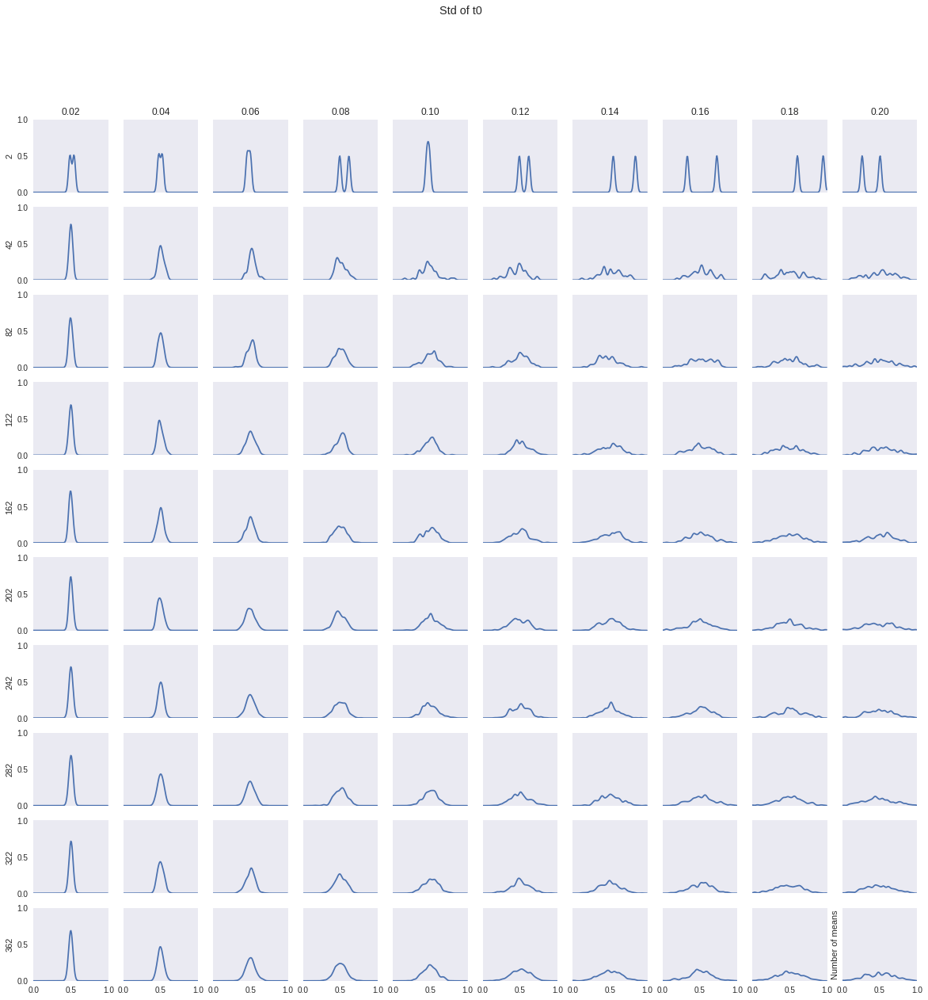

In [0]:
latency_fluct(g_1, (0, 1))

#### G_2




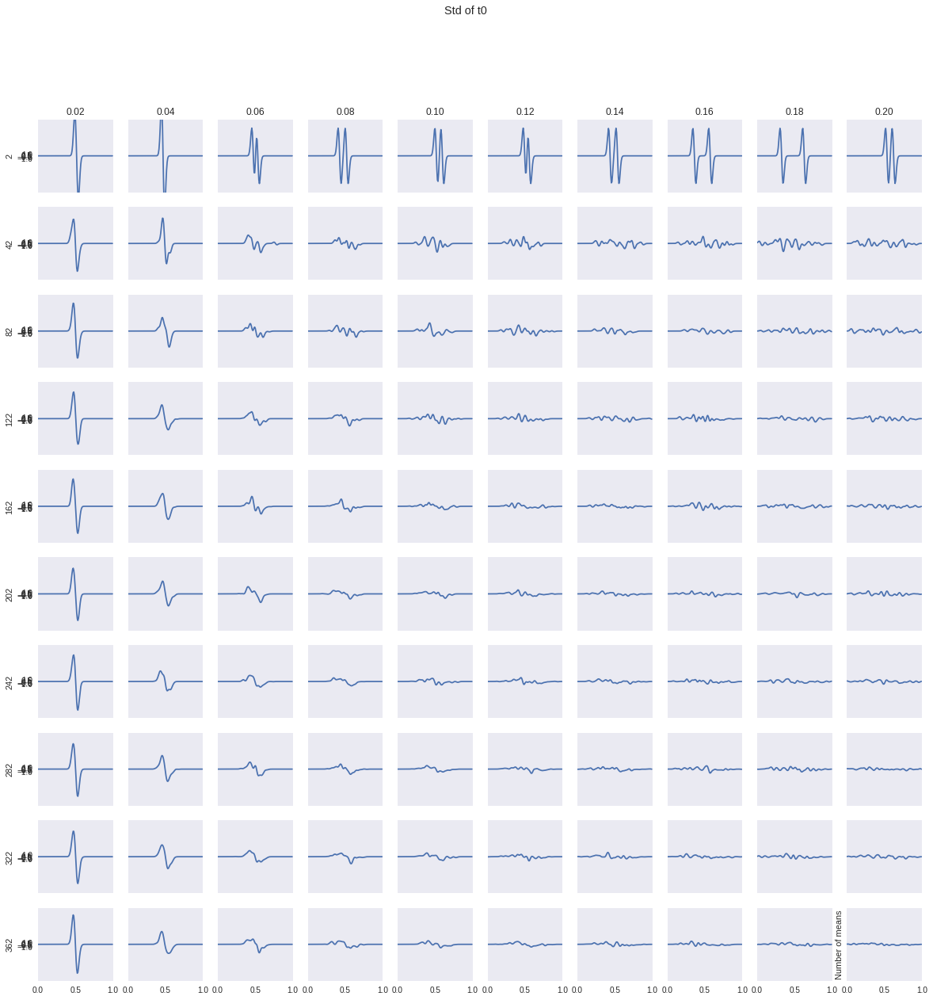

In [0]:
latency_fluct(g_2, (-20, 20))

#### G_3

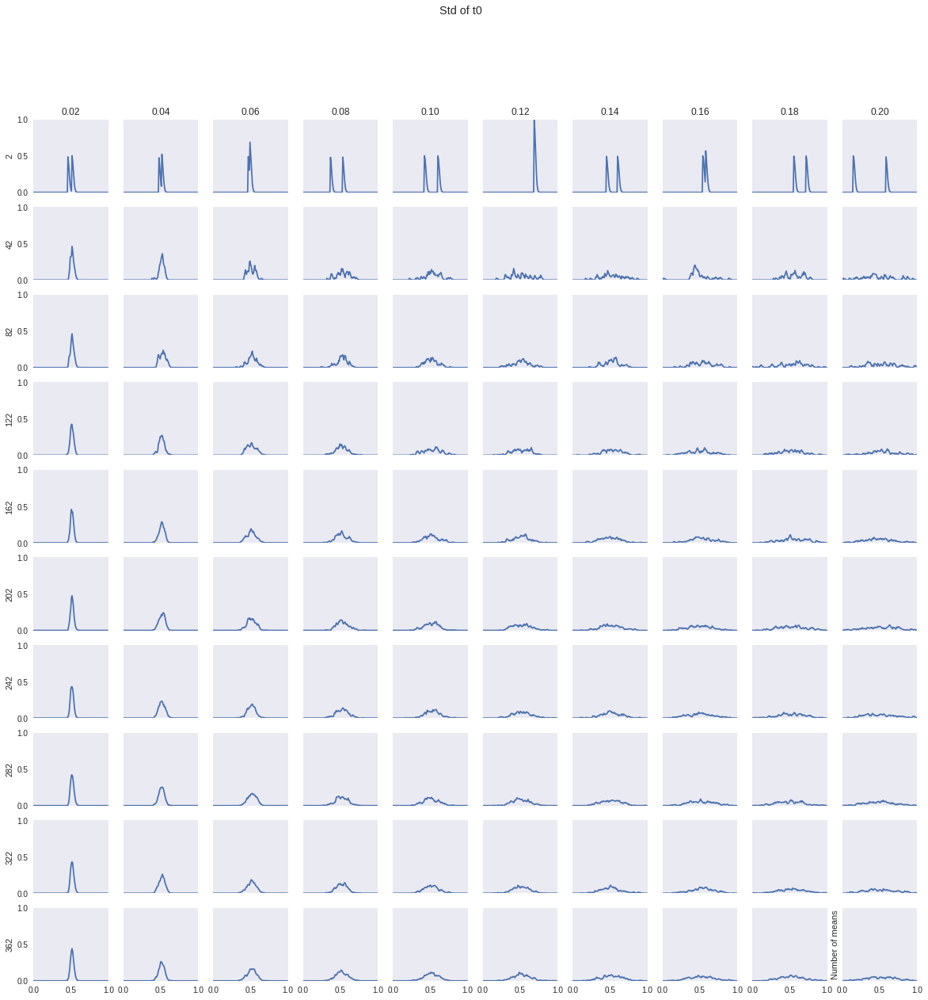

In [0]:
latency_fluct(g_3, (0, 1))

## Filtry

---


#### Filter Definitions

In [0]:
from scipy.signal import butter, filtfilt, iirnotch, freqz, lfilter, cheby2


def _butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a


def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = _butter_lowpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y


def _butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a


def butter_highpass_filter(data, cutoff, fs, order=5):
    b, a = _butter_highpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y


def notch_filter(data, f0, fs, Q=30):
    nyq = 0.5 * fs
    w0 = f0/nyq
    b, a = iirnotch(w0, Q)
    y = filtfilt(b, a, data)
    return y
  
  
def _cheb2_notch(cutoff, fs, order=5, rs=3, width=.1):
    nq = fs/2
    Wn_min, Wn_max = (cutoff - width) / nq, (cutoff + width) / nq
    Wn = [Wn_min, Wn_max]
    b, a = cheby2(N=order, rs=rs, Wn=Wn, btype='bandstop', analog=False, output='ba')
    return b, a

In [0]:
def filter_test(a, b, f=None, T=1, Fs=128):
    if not f:
      f = np.arange(0.01, Fs/2, 0.01)
    
    t = np.arange(-T, T, 1/Fs)

    w = 2*np.pi* f/Fs

    w, h = freqz(b, a, w)
    
    m = np.abs(h)

    x = impulse(len(t))
    y = lfilter(b,a,x)

    plt.subplot(1,2,1)
    plt.title('moduł transmitancji')
    plt.plot(f, 20*np.log10(m))
    plt.ylabel('[dB]')
    plt.xlabel('f [Hz]')
    plt.grid('on')
  
    plt.subplot(1,2,2)
    plt.title('odpowiedź impulsowa')
    plt.plot(t, x)
    plt.plot(t, y)
    plt.xlim([-T,T])
    plt.xlabel('t [s]')
    plt.grid('on')

### Test Filters

In [0]:
def plot_charaktrystkyki(filter_function, cutoffs, orders):
  for cutoff, order in itertools.product(cutoffs, orders):
      b, a = filter_function(cutoff, Fs, order)

      fig = plt.figure(figsize=(20, 3))
      fig.subplots_adjust(hspace=.5)

      filter_test(a, b)
      
      filter_name = filter_function.__name__[1:].replace("_", " ").title()
      plt.suptitle(f'filter: {filter_name}, order: {order}, cuttoff: {cutoff}Hz')
      plt.show()
  

#### Low Pass

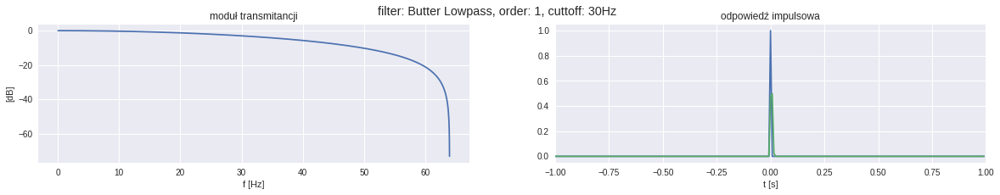

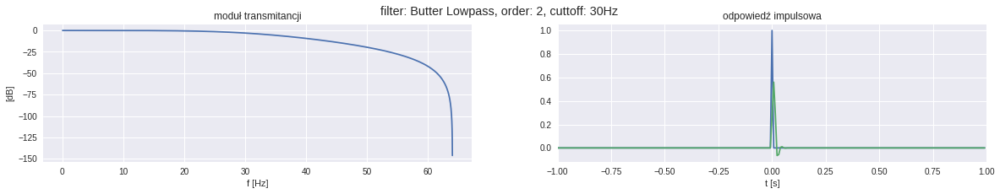

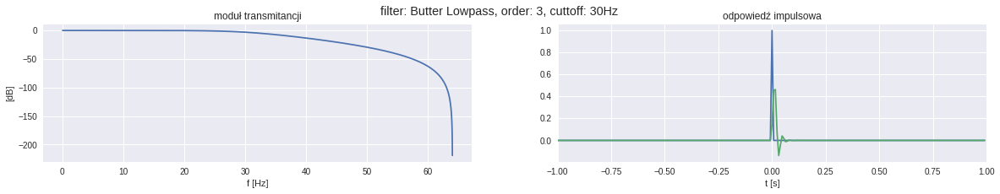

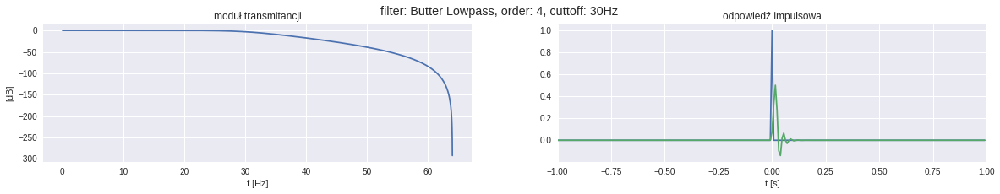

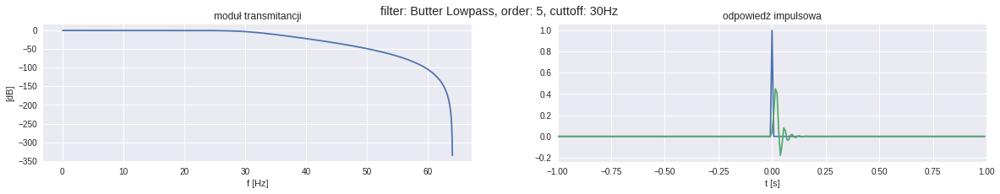

...

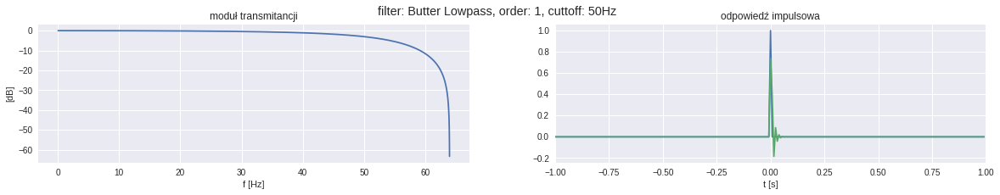

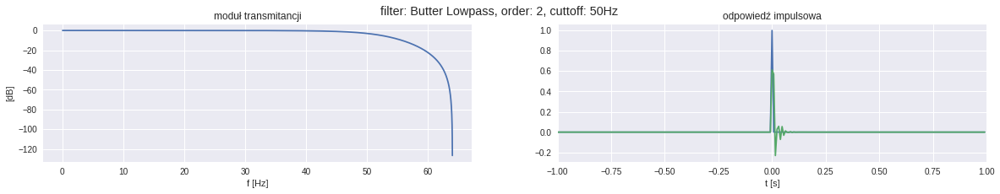

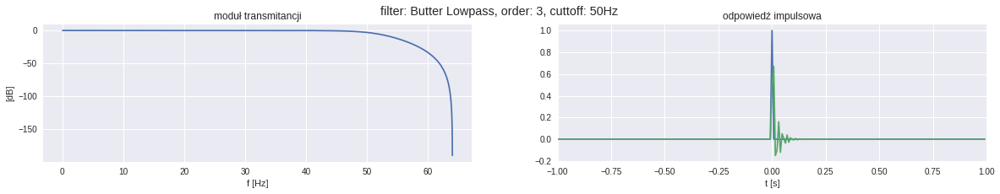

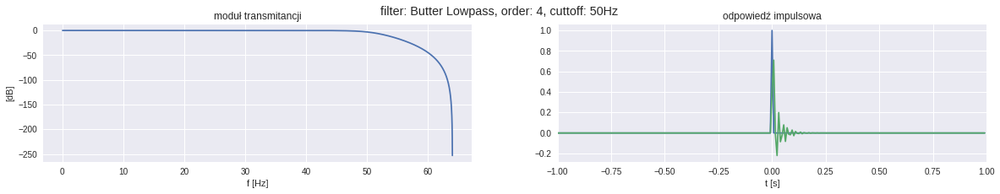

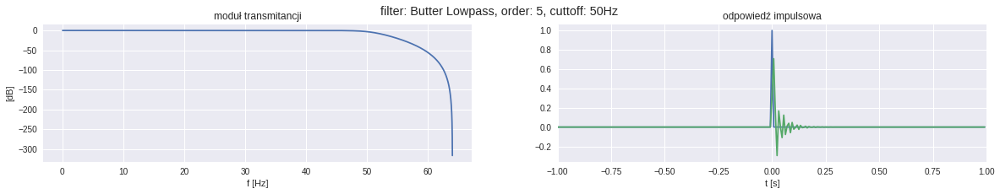

In [0]:
Fs = 128

orders = range(1,6)
cutoffs = [30, 40, 50]
plot_charaktrystkyki(_butter_lowpass, cutoffs, orders)




#### High Pass

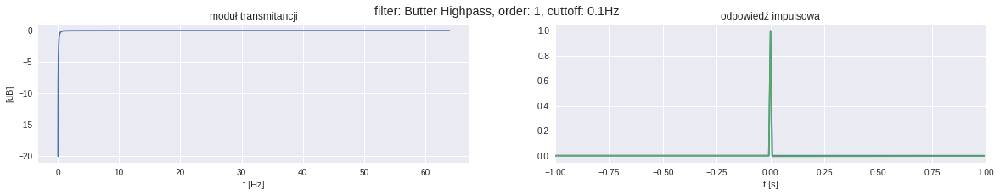

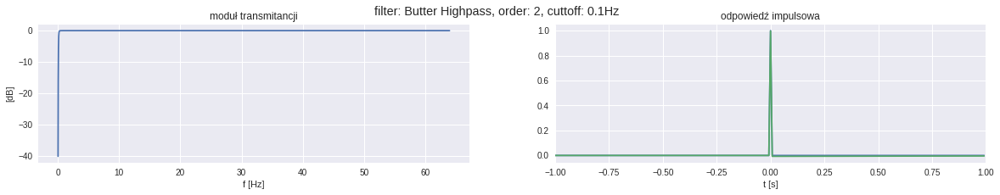

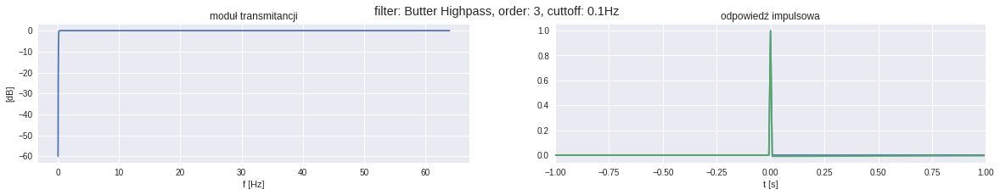

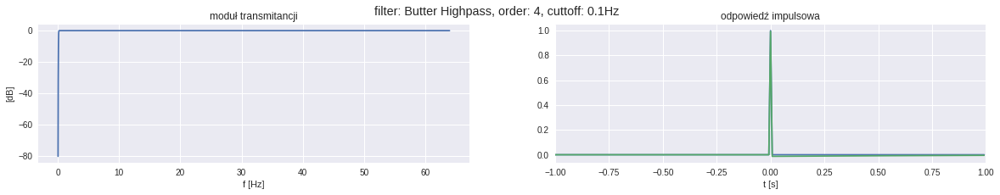

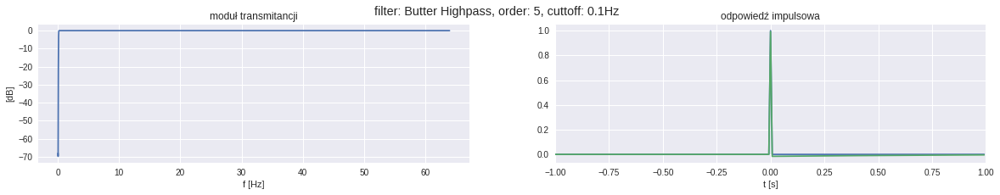

...

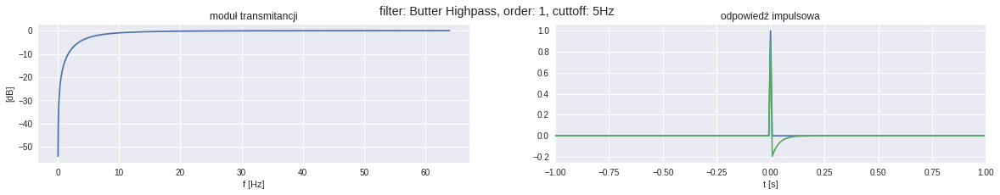

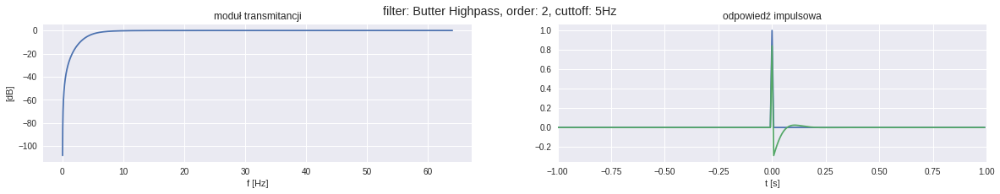

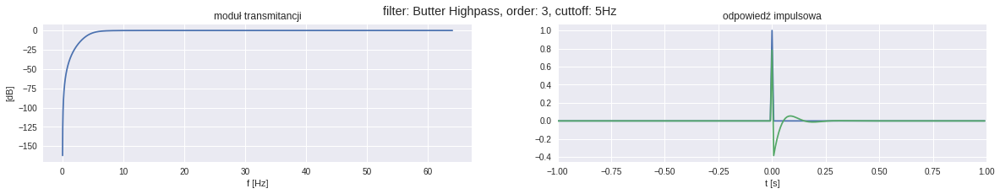

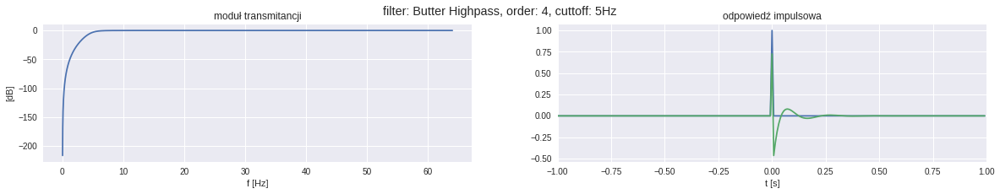

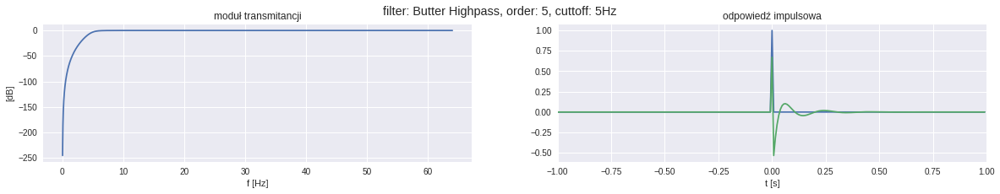

In [0]:
Fs = 128
orders = range(1,6)
cutoffs = [0.1, 0.5, 2, 5 ]
plot_charaktrystkyki(_butter_highpass, cutoffs, orders)

  


#### Notch (Cheby2)

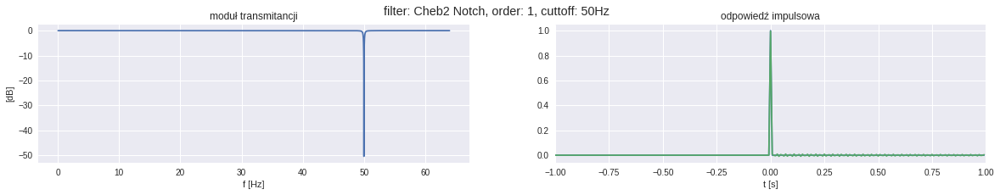

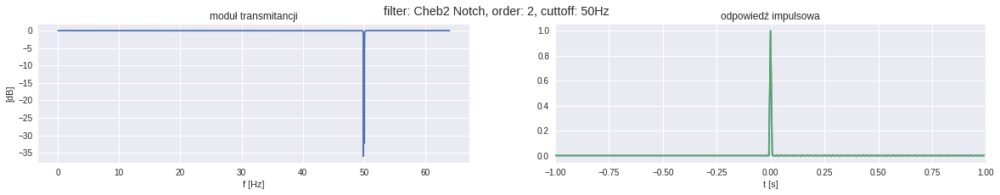

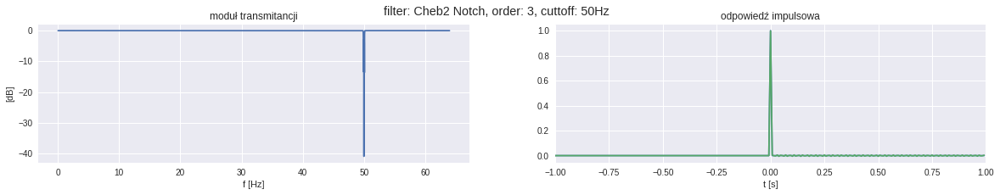

In [0]:
Fs = 128

cutoffs = [50]
orders = range(1,4)

plot_charaktrystkyki(_cheb2_notch, cutoffs, orders)

### Check response on signals

In [0]:
def plot_response(s, t, filter_function, Fs, cutoffs, orders):
  for cutoff, order in itertools.product(cutoffs, orders):

      b, a = filter_function(cutoff, Fs, order)
    
      fig = plt.figure(figsize=(20, 3))
      fig.subplots_adjust(hspace=.5)
      
      for i, _s in enumerate(s):
        fig.add_subplot(1, len(s), i+1)

        y1 = filtfilt(b, a, _s)
        y2 = lfilter(b, a, _s)

        plt.plot(t, _s, label='primary', alpha=0.5, c='k', lw=3)
        plt.plot(t, y1, label='filtfilt', alpha=0.5, c='r')
        plt.plot(t, y2, label='lfilter', alpha=0.5, c='g')

        plt.legend()
        plt.title('G_{}'.format(i+1))
        
      filter_name = filter_function.__name__[1:].replace("_", " ").title()
      plt.suptitle(f'filter: {filter_name}, order: {order}, cuttoff: {cutoff}Hz')
  plt.show()

#### Low Pass

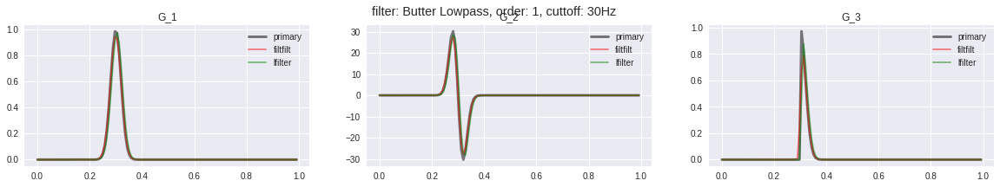

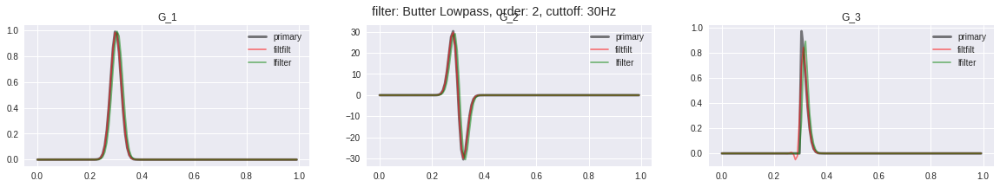

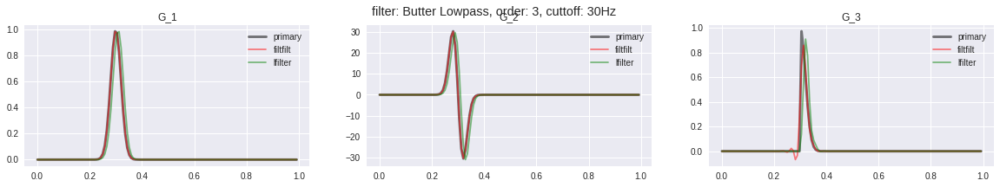

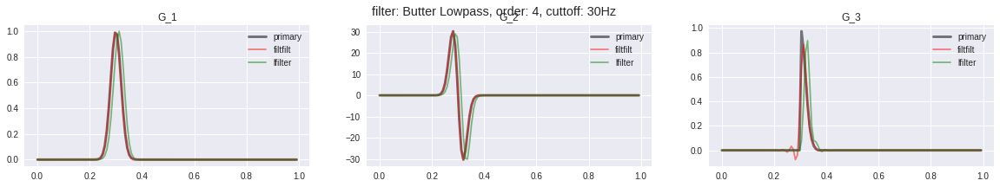

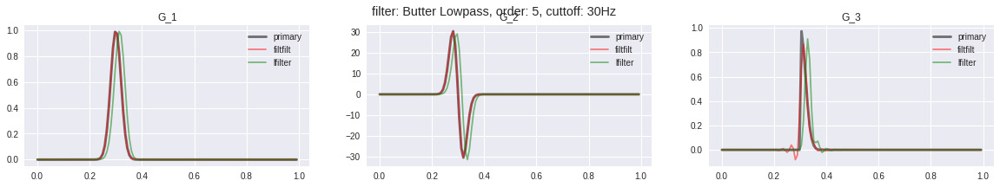

...

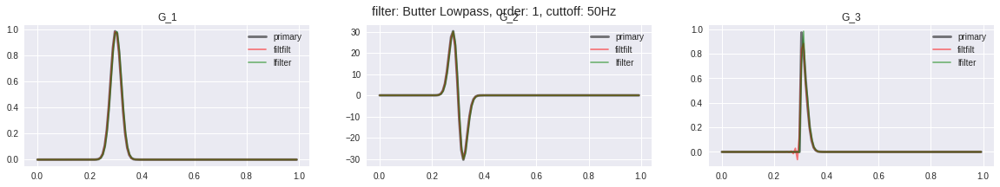

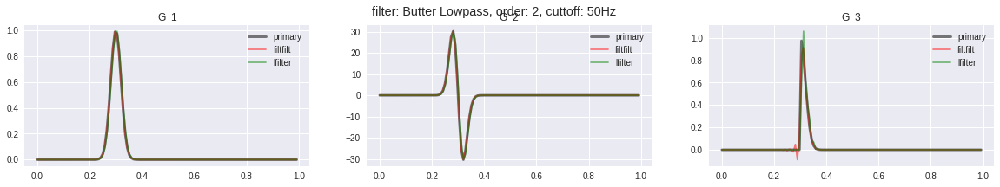

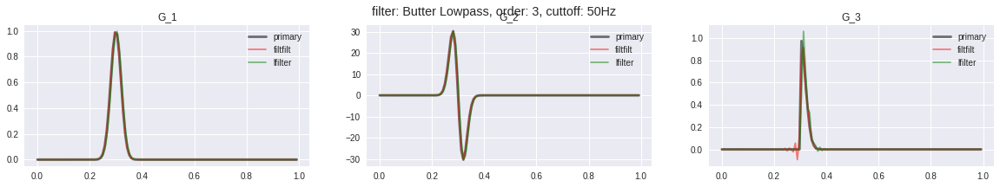

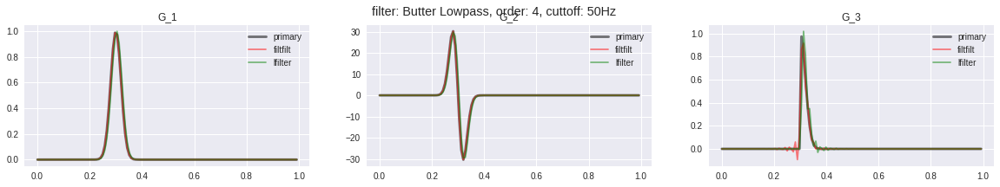

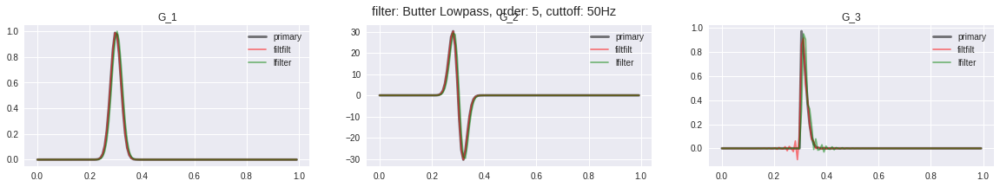

In [0]:
Fs = 128

orders = range(1,6)
cutoffs = [30, 40, 50]

t, s1 = g_1(**params)
t, s2 = g_2(**params)
t, s3 = g_3(**params)

plot_response((s1, s2, s3), t, _butter_lowpass, Fs, cutoffs, orders)

#### High Pass

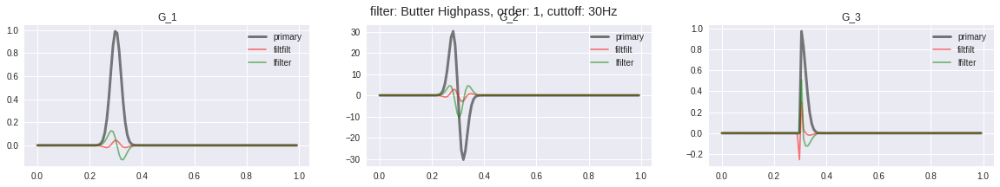

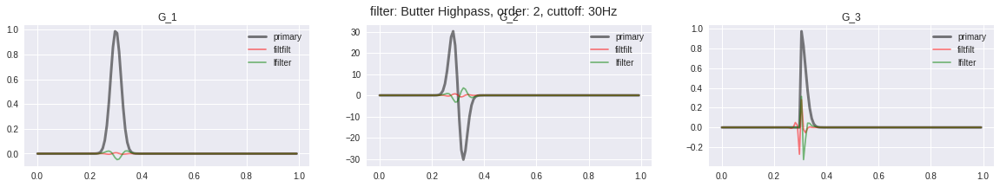

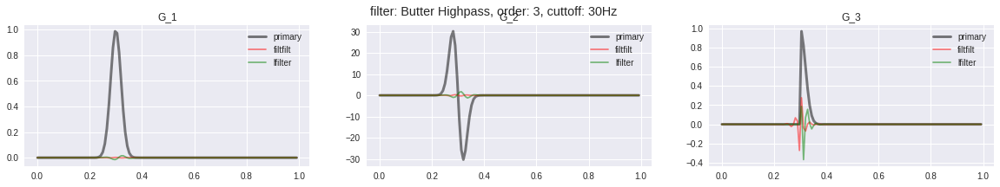

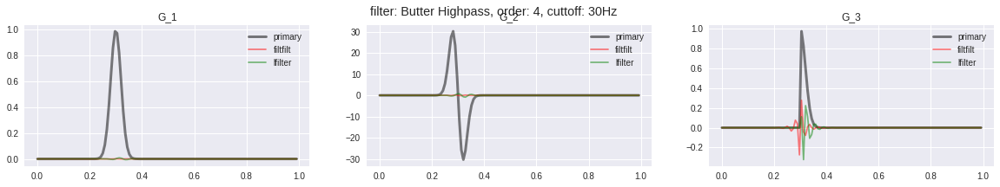

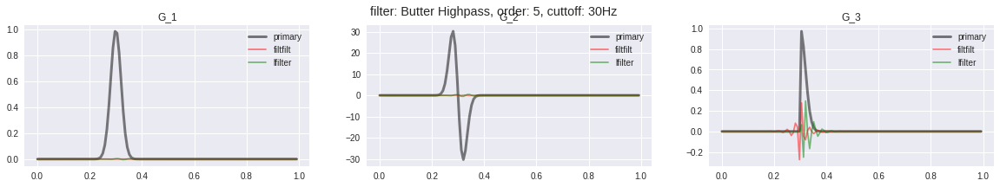

...

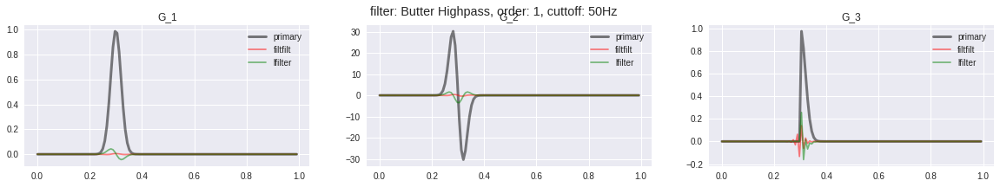

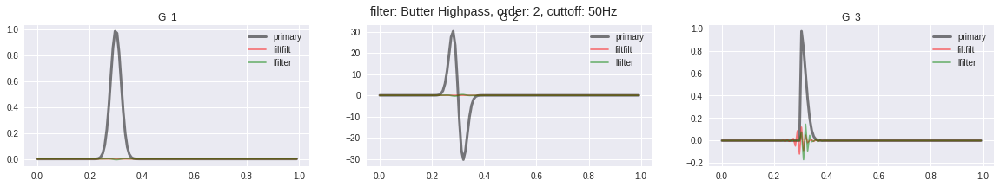

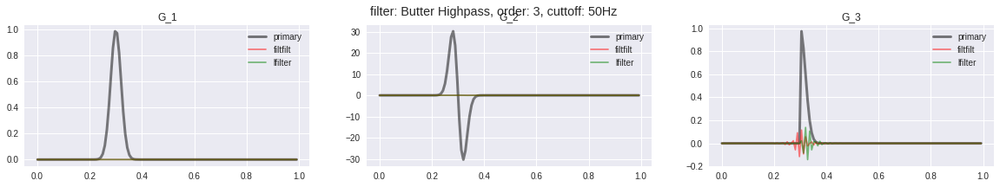

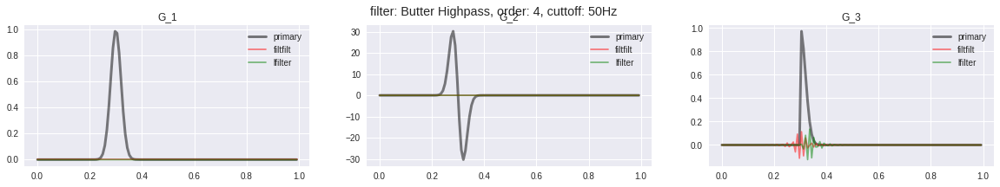

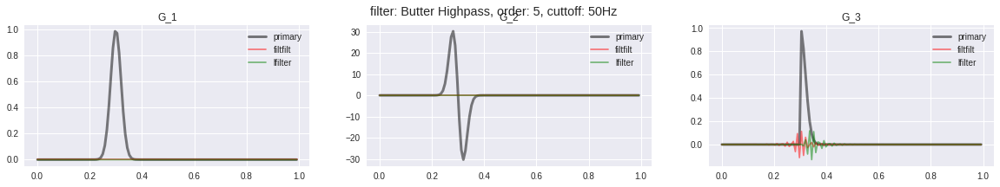

In [0]:
Fs = 128

orders = range(1,6)
cutoffs = [30, 40, 50]

t, s1 = g_1(**params)
t, s2 = g_2(**params)
t, s3 = g_3(**params)

plot_response((s1, s2, s3), t, _butter_highpass, Fs, cutoffs, orders)

#### Notch (Cheby2)

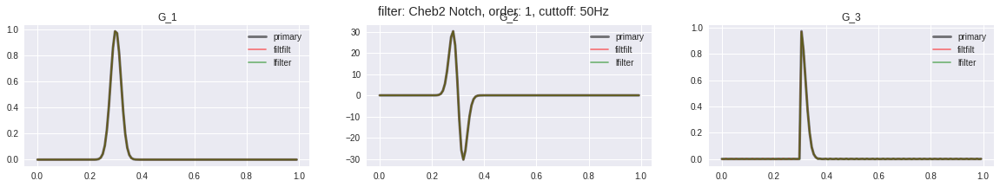

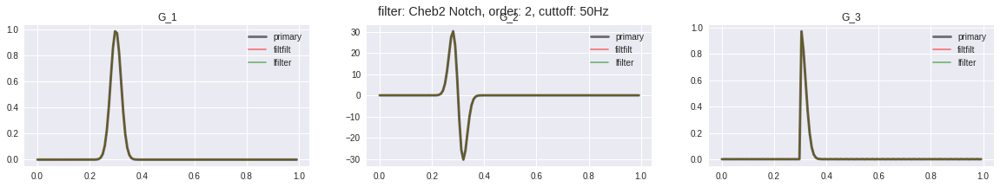

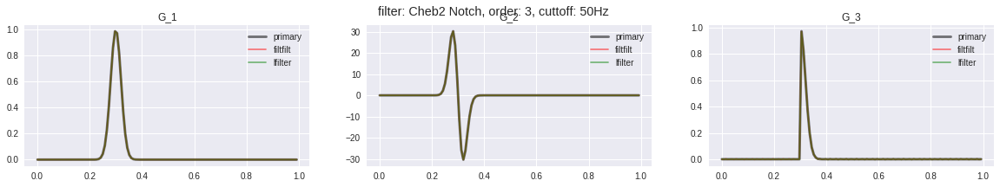

In [0]:
Fs = 128

cutoffs = [50]
orders = range(1,4)

t, s1 = g_1(**params)
t, s2 = g_2(**params)
t, s3 = g_3(**params)

plot_response((s1, s2, s3), t, _cheb2_notch, Fs, cutoffs, orders)

### Sygnał + Szum

In [0]:
def syg_plus_noise(g, N, params):
  x, g = g(**params)
  sims = np.empty((N, len(x)))
  for i in range(N):
    x, g_noise = noise(**params)
    sims[i] = g + g_noise
  return x, sims

In [0]:
def f(t, signals, filter_function, cutoffs, orders, Fs):
  for cutoff, order in itertools.product(cutoffs, orders):

    b, a = filter_function(cutoff, Fs, order)

    fig = plt.figure(figsize=(15, 3))
    fig.subplots_adjust(hspace=.5)
    
    fig.tight_layout()

    for i, signal in enumerate(signals):
      fig.add_subplot(1, len(signals), i+1)

      y = []

      for s in signal:
        y.append(filtfilt(b, a, s))

      y = np.mean(y, axis=0)

      plt.plot(t, np.mean(signal, axis=0), c='k', lw='3', alpha=0.5)
      plt.plot(t, y, c='r', alpha=0.5)
      plt.title('G_{}'.format(i+1))
    filter_name = filter_function.__name__[1:].replace("_", " ").title()
    plt.suptitle(f'filter: {filter_name}, order: {order}, cuttoff: {cutoff}Hz')
  plt.show()   

#### Low Pass

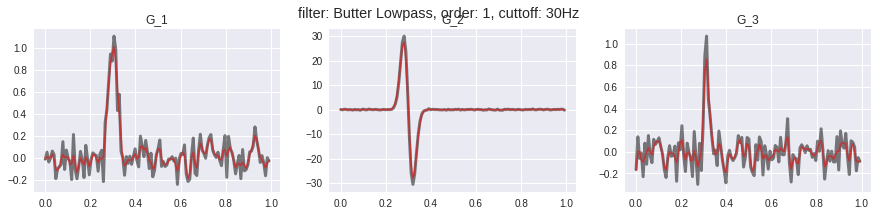

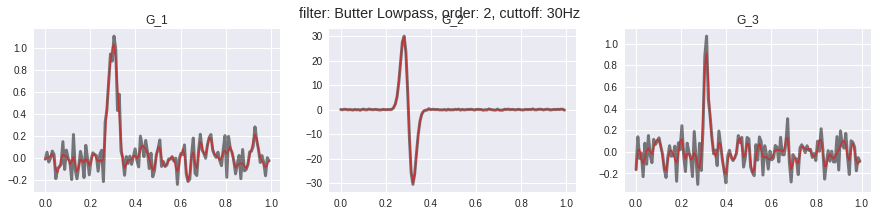

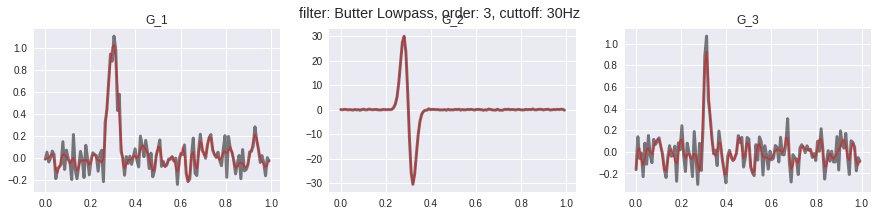

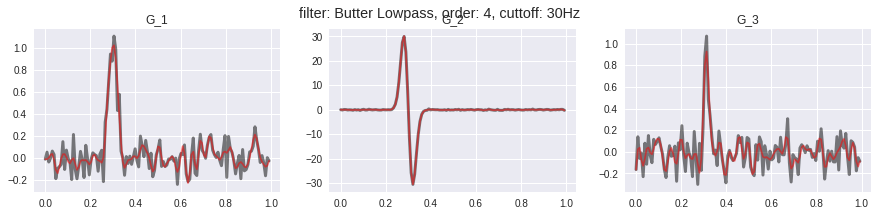

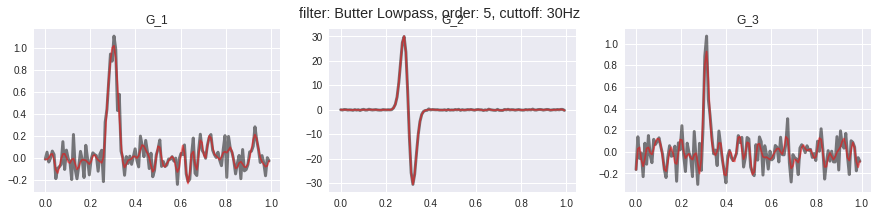

...

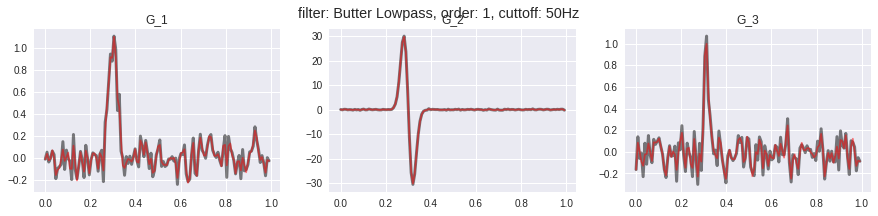

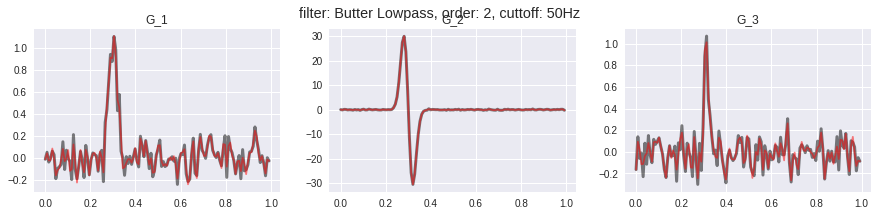

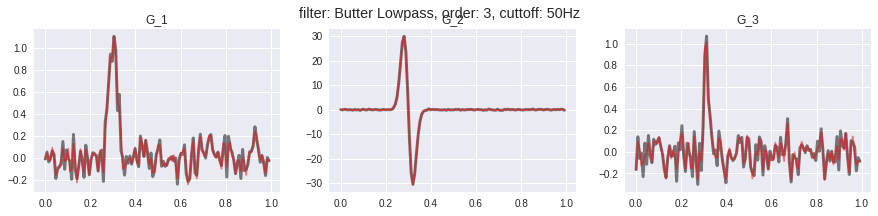

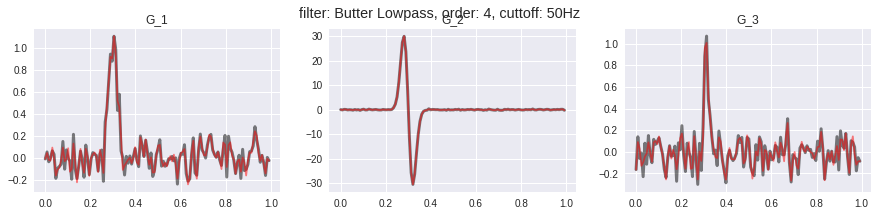

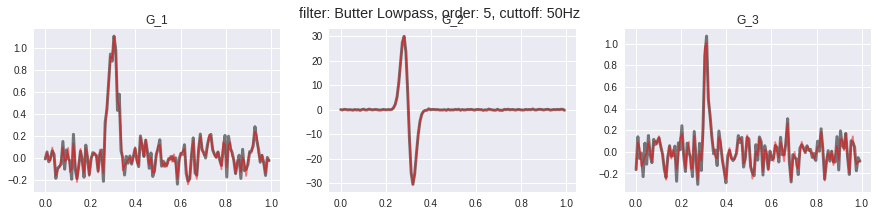

In [0]:
Fs = 128

orders = range(1,6)
cutoffs = [30, 40, 50]

x, signal1 = syg_plus_noise(g_1, 60, params)
x, signal2 = syg_plus_noise(g_2, 60, params)
x, signal3 = syg_plus_noise(g_3, 60, params)

f(x, (signal1, signal2, signal3), _butter_lowpass, cutoffs, orders, Fs)

#### High Pass

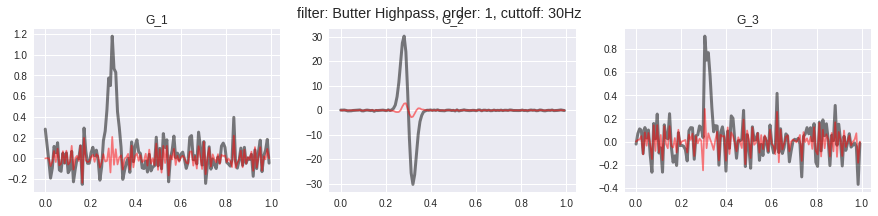

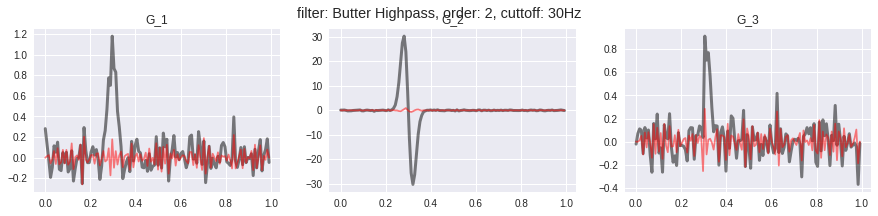

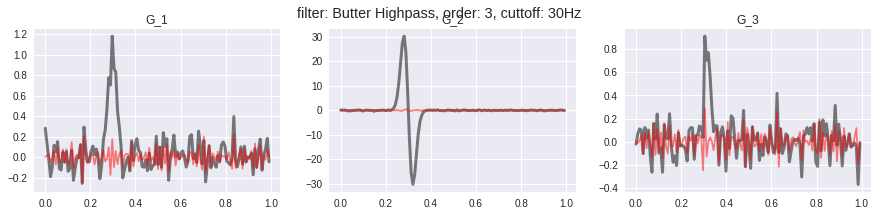

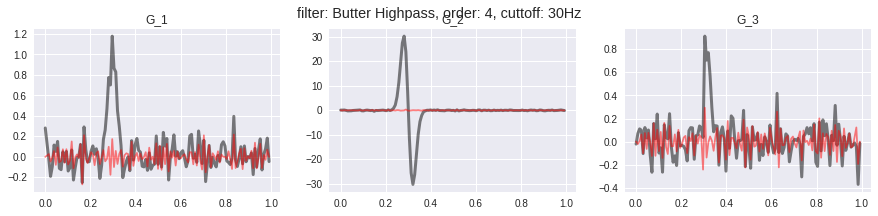

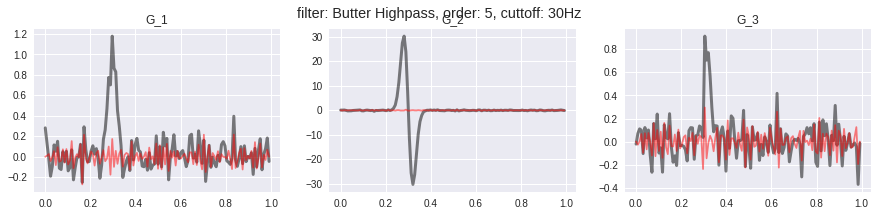

...

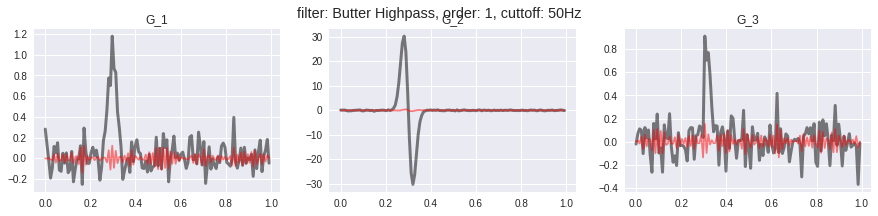

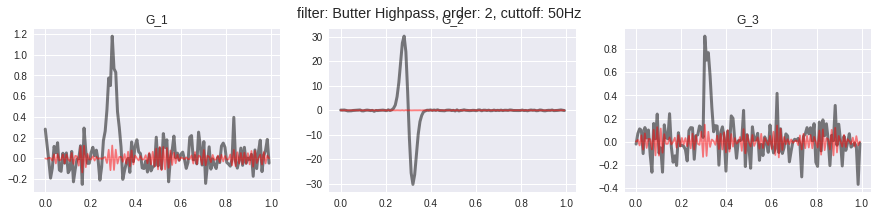

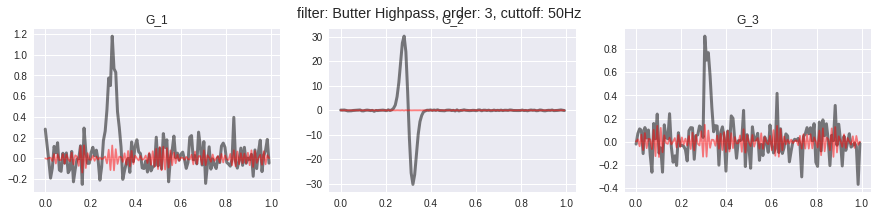

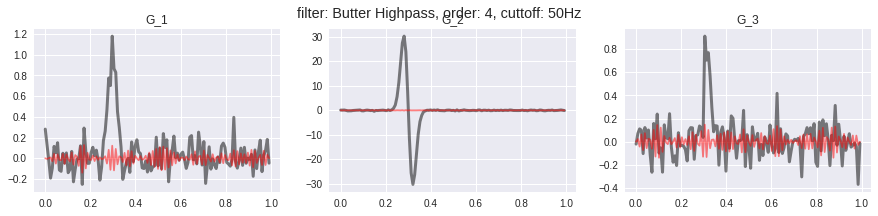

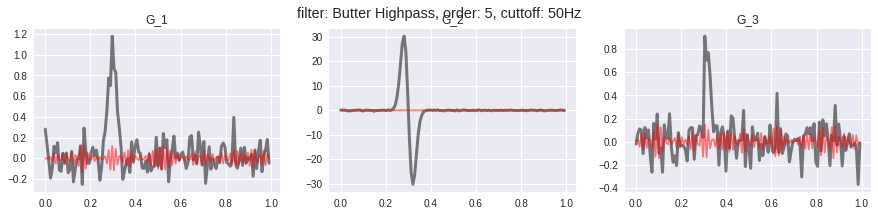

In [0]:
Fs = 128

orders = range(1,6)
cutoffs = [30, 40, 50]

x, signal1 = syg_plus_noise(g_1, 60, params)
x, signal2 = syg_plus_noise(g_2, 60, params)
x, signal3 = syg_plus_noise(g_3, 60, params)

f(x, (signal1, signal2, signal3), _butter_highpass, cutoffs, orders, Fs)

#### Notch (Cheby2)

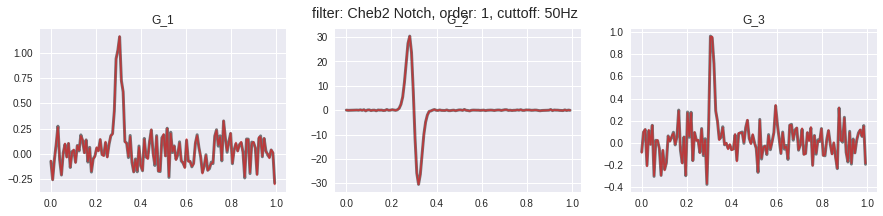

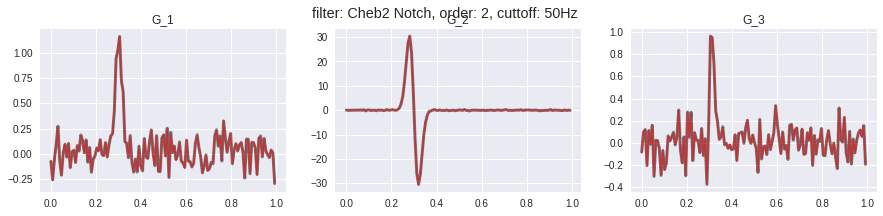

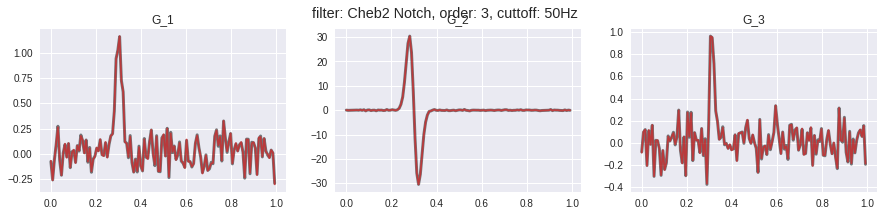

In [0]:
Fs = 128

cutoffs = [50]
orders = range(1,4)

x, signal1 = syg_plus_noise(g_1, 60, params)
x, signal2 = syg_plus_noise(g_2, 60, params)
x, signal3 = syg_plus_noise(g_3, 60, params)

f(x, (signal1, signal2, signal3), _cheb2_notch, cutoffs, orders, Fs)

# Analiza Sygnału

##Wersja 1.1: Obserwacja jednej błyskającej diody

### Read Data

#### Reading signals


In [0]:
filename = "p300_1.1"
site = 'http://studenci.fuw.edu.pl/~cp383253/cw2/'

extentions = ['.xml', '.raw', '.tag']

for ext in extentions:

  if os.path.isfile(filename+ext):
    pass
  else:
    www = os.path.join(site, filename+ext)
    os.system(f'wget {www}')

mgr = ReadManager("%s.xml"%filename, "%s.raw"%filename, "%s.tag"%filename)
fs = int(float(mgr.get_param("sampling_frequency")))
num_of_channels = int(mgr.get_param("number_of_channels"))
channels_names = mgr.get_param("channels_names")

raw_syg = mgr.get_microvolt_samples()
t = np.arange(raw_syg.shape[1])/fs


2018-11-15 12:48:26,594 - data_source - INFO - All data set requested for the first time. Start reading all data from the file...


#### Montage

In [0]:
montage_syg = np.copy(raw_syg)
montage_syg[:-3,:] -= (raw_syg[channels_names.index('TP9'),:] + raw_syg[channels_names.index('TP10'),:])/2

### Filtering

#### Define filter

In [0]:
def filter_data(data, fs):
  '''
  Filtering 0.1 - 20 Hz
  '''
  data = butter_lowpass_filter(data, 20, fs, order=2)

  data = butter_highpass_filter(data, 0.1, fs, order=2)

  data = notch_filter(data, 50, fs)

  return data

In [0]:
syg_1 = np.copy(montage_syg[:, 74*fs :int(175*1.06*fs)])
t = np.copy(t[74*fs :int(175*1.06*fs)])


for channel in channels_names[:-3]:
  index = channels_names.index(channel)
  syg_1[index,:] = filter_data(syg_1[index,:], fs)

#### Display Filtered Data

In [0]:
for i, channel in zip(range(len(channels_names)), channels_names):
  
  start_time = 80
  end_time = 180
  
  plt.plot(
      t[start_time * fs:end_time * fs],
      syg[i, start_time * fs:end_time * fs]
  )
  plt.title(channel)
  plt.xlabel('czas [s]')
  plt.show()

NameError: ignored

### Detect artifacts

In [0]:
def find_artefacts_tags(syg, threshold=75):
  return np.array([index for index, value in enumerate(syg) if value > threshold or value < -threshold])

### Diode Populate

In [0]:
def diode_to_tags(signal):
  signal = np.copy(signal) / np.max(signal)
  
  indexes = [i for i, sig in enumerate(signal) if sig > 0.9]
  
  index_indexes = [i for i, index in enumerate(np.diff(indexes)) if index > 1]
  
  index_indexes += [len(indexes) - 1]
  
  tags = list(map(lambda x: indexes[x], index_indexes))
  
  return np.array(tags)

In [0]:
# index = channels_names.index('d2')

# tags = diode_to_tags(syg[index, :])

NameError: ignored

#### Time to Tags

In [0]:
def time_to_tags(time, fs):
  '''
  time - time in seconds
  fs - sampling rate
  '''
  return int(time * fs)

#### Population

In [0]:
def is_there_an_artefact_constructor(low, high):
	return lambda x: x >= low and x <= high

def is_artifact_for_tag(low, high, artefacts):
  def output(tag):
    number_of_artefacts = len(list(filter(
          is_there_an_artefact_constructor(tag + low, tag + high + 1),
          artefacts
      )))
    
    return False if number_of_artefacts else True
  
  return output
  

def populate_tag(tag, syg, low, high):

  return syg[:, tag + low : tag + high + 1]

def populate_tags(tags, syg, artefacts, low=-0.3, high=0.4, fs=128):
  '''
  syg - array of channels with shape (n, Fs)
  '''
  low_tag_diff = time_to_tags(low, fs)
  
  high_tag_diff = time_to_tags(high, fs)
  
  _tags = list(filter(is_artifact_for_tag(low_tag_diff, high_tag_diff, artefacts), tags))
  
  populated_tags_generator = map(
      lambda tag: populate_tag(tag, syg, low_tag_diff, high_tag_diff),
      _tags
  )
  
  delta = high - low

  t = np.arange(int(fs * delta)+1)
  t = t / fs + low
  
  return t, np.array(list(populated_tags_generator))
  

#### Full

In [0]:
artefacts = find_artefacts_tags(syg[channels_names.index('Fp1'), :])

index = channels_names.index('d2')

tags = diode_to_tags(syg[index, :])

t, erp_components = populate_tags(tags, syg, fs=fs)

erps = np.mean(erp_components, axis=0)

P2_I = []

for erp, channel_name in zip(erps[:-3], channels_names[:-3]):
  plt.title(channel_name)
 
  
  low = int((0.11 + 0.3) * fs)
  high = int((0.22 + 0.3) * fs)
  
  _min = np.min(erp[low:high])
  
  index_min = np.where(erp[low:high] == _min)[0][0]
  
  plt.plot(t[low + index_min], _min, 'go')
  
  low += index_min
  
  _max = np.max(erp[low:high])
  
  index_max = np.where(erp[low:high] == _max)[0][0]

  plt.plot(t[low + index_max], _max, 'ro')
  
  P2_I.append(_max - _min)
    
  plt.plot(t, erp)
  plt.axvline(0, color='r', alpha=0.25)
  plt.axvline(0.11, color='g', alpha=0.25)
  plt.axvline(0.22, color='g', alpha=0.25)
  plt.xlim(-0.3, 0.4)
  plt.show()

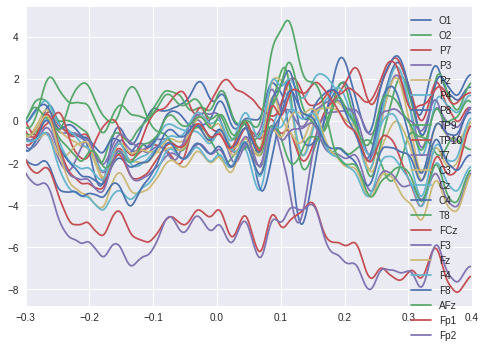

In [0]:
for erp, channel_name in zip(erps[:-3], channels_names[:-3]):
  if channel_name == 'F7':
    continue

  plt.plot(t, erp, label=channel_name)
  plt.xlim(-0.3, 0.4)
plt.legend()
plt.show()

### coś

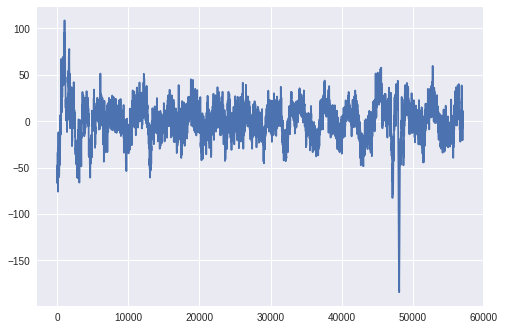

In [0]:
plt.plot(syg[1,:])
plt.show()

In [0]:
# d2_mask = np.less(d2, np.mean(d2))

# indexes = [i for i in range(1, len(d2_mask)) if d2_mask[i-1]==1 and d2_mask[i]==0]
# minus_delta, plus_delta = int(0.3*fs), int(.4*fs)
# indexes_boundaries = [(i-minus_delta, i + plus_delta) for i in indexes]


NameError: ignored

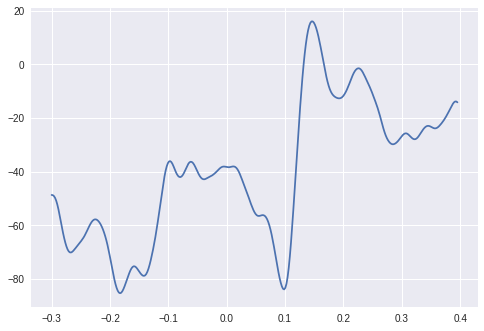

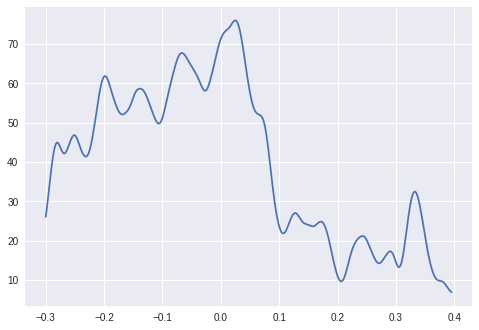

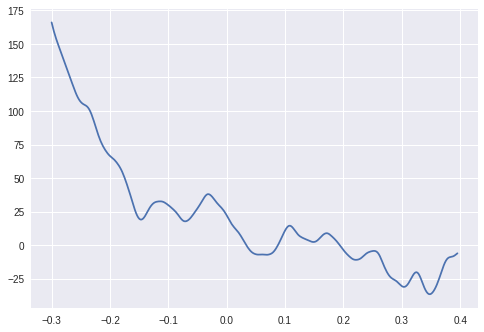

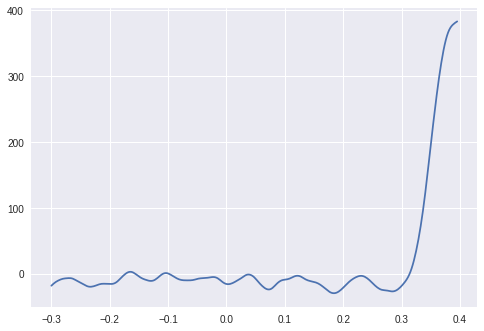

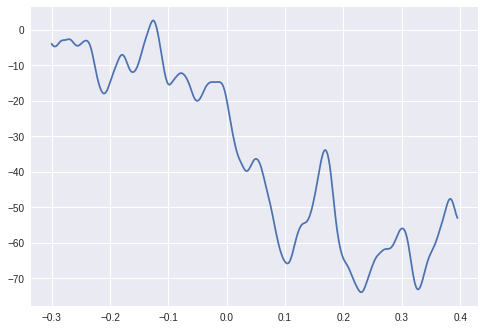

...

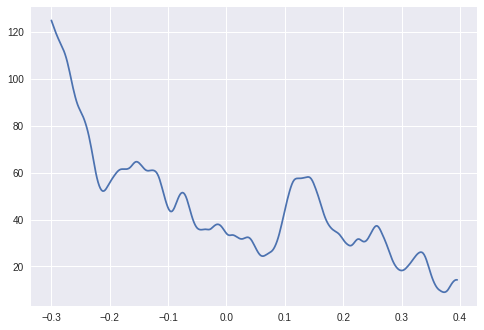

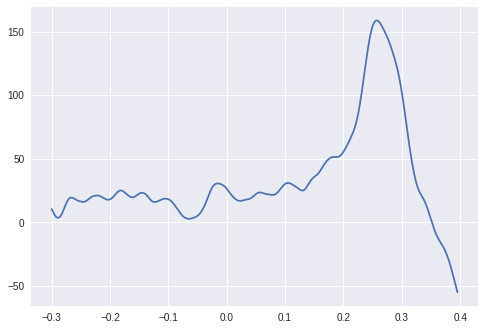

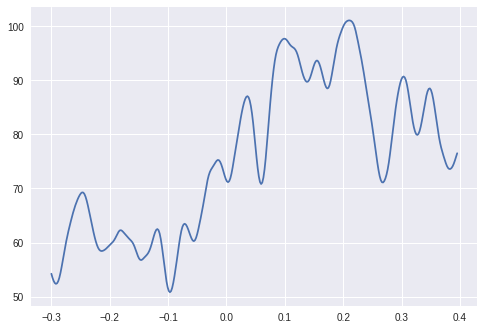

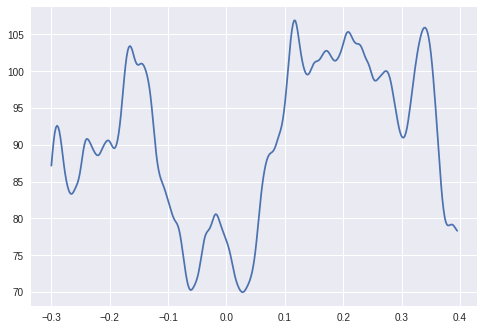

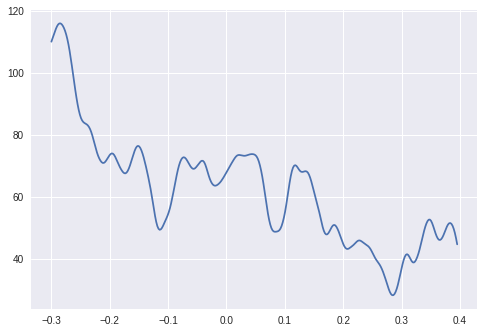

left = 79
4621	4978
5131	5488
8774	9131
11808	12165
12791	13148
24593	24950
25556	25913
26579	26936
27122	27479
31185	31542
32222	32579
33800	34157
35350	35707
37426	37783
39942	40299
41442	41799
45070	45427
47660	48017
54379	54736
54881	55238
55413	55770


In [0]:
# indexes_filterd = []
# removed = []
# for i, index in  enumerate(indexes):
#   bound_low, bound_high = indexes_boundaries[i]
#   s = syg[channels_names.index('Fp1'),bound_low:bound_high]
#   s_min, s_max = np.min(s), np.max(s)
#   boundaries = (bound_low, bound_high)
#   if s_min < -70 or s_max > 70:
#     if boundaries not in removed:
#       removed.append(boundaries)
#       plt.plot(np.arange(int(fs*0.7)-1)/fs -0.3, s)
#       plt.show()
#   else:
#     if boundaries not in indexes_filterd:
#       indexes_filterd.append(boundaries)
    
# print('left =', len(indexes_filterd))
# for x in removed:
#   print('%s\t%s'%x)

In [0]:
# print(len(indexes_filterd))

79


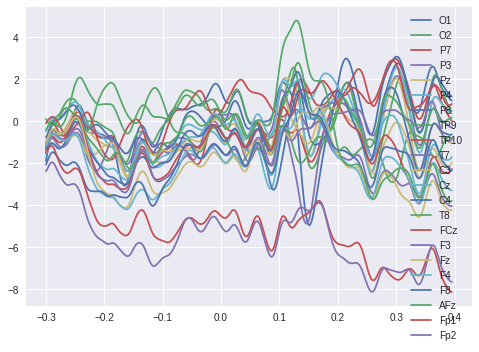

In [0]:
# for k, name in enumerate(channels_names[:-3]):
#   if name == 'F7':
#     continue
#   p300 = np.zeros(int(fs*0.7)-1)

#   for bound_low, bound_high in indexes_filterd:
#     p300 += syg[k,bound_low:bound_high]


#   p300 /= len(indexes_filterd)
#   plt.plot(np.arange(int(fs*0.7)-1)/fs -0.3, p300, label=name)

# plt.legend()
# plt.show()

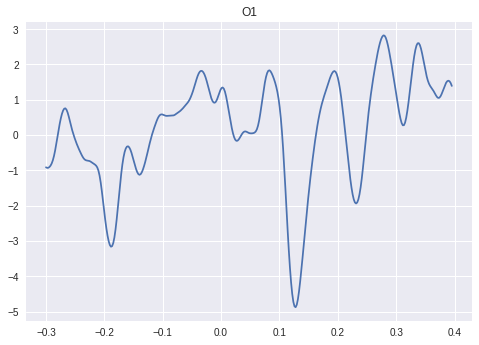

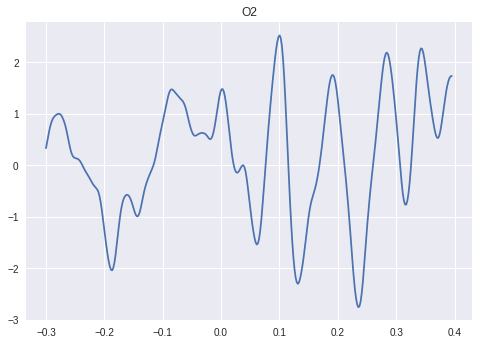

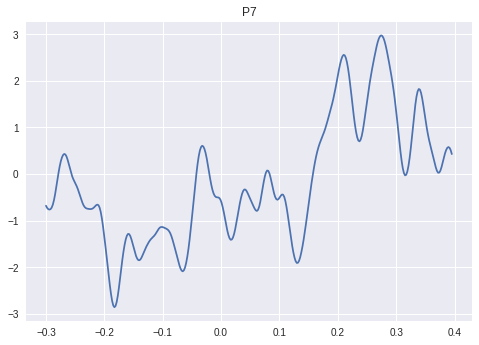

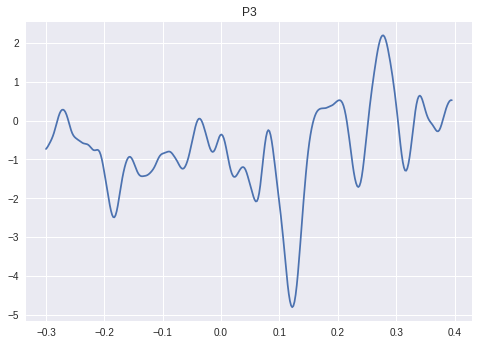

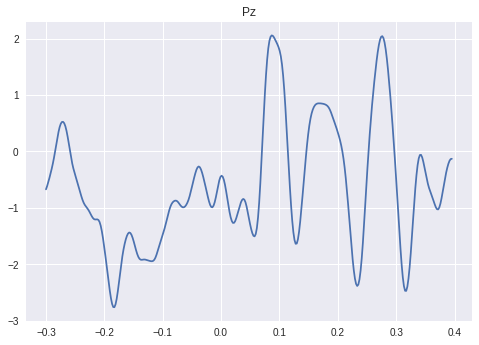

...

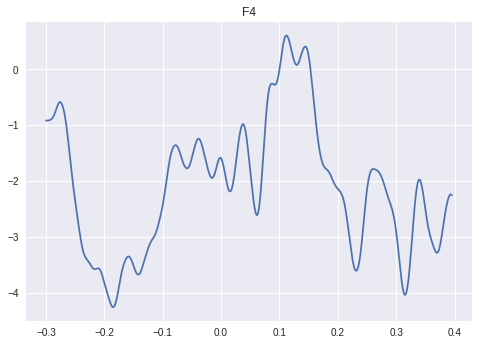

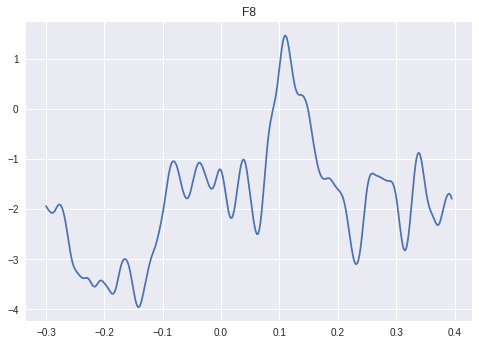

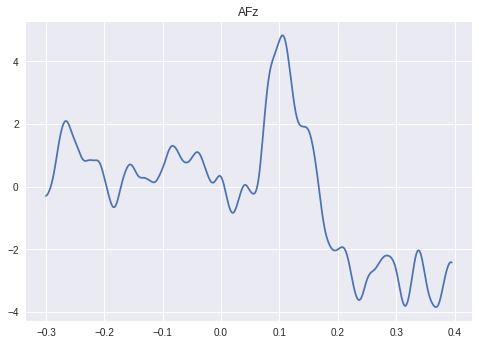

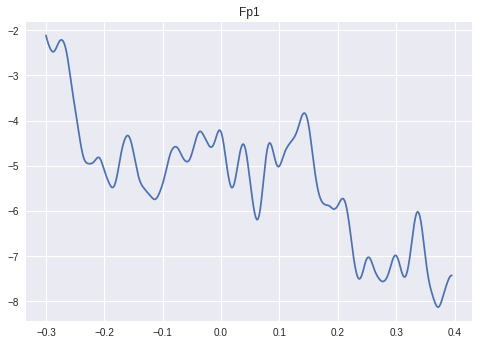

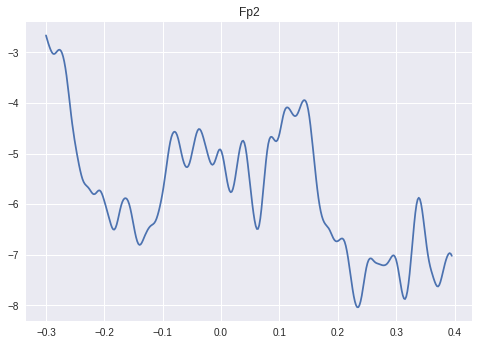

In [0]:
# for k, name in enumerate(channels_names[:-3]):
#   if name == 'F7':
#     continue
#   p300 = np.zeros(int(fs*0.7)-1)

#   for bound_low, bound_high in indexes_filterd:
#     p300 += syg[k,bound_low:bound_high]


#   p300 /= len(indexes_filterd)
#   plt.plot(np.arange(int(fs*0.7)-1)/fs -0.3, p300)

#   plt.title(name)
#   plt.show()

In [0]:
# indexes

[12486, 20677, 28770, 37118, 45236, 53531]

In [0]:
# indexes_filterd

[4633,
 4990,
 5143,
 5500,
 5636,
 5993,
 6186,
 6543,
 6746,
 7103,
 7301,
 7658,
 7790,
 8147,
 8323,
 8680,
 8786,
 9143,
 9289,
 9646,
 9755,
 10112,
 10232,
 10589,
 10743,
 11100]

In [0]:
# indexes_filterd

[(4633, 4990),
 (5143, 5500),
 (5636, 5993),
 (6186, 6543),
 (6746, 7103),
 (7301, 7658),
 (7790, 8147),
 (8323, 8680),
 (8786, 9143),
 (9289, 9646),
 (9755, 10112),
 (10232, 10589),
 (10743, 11100),
 (11272, 11629),
 (11820, 12177),
 (12333, 12690),
 (12803, 13160),
 (13360, 13717),
 (13912, 14269),
 (14426, 14783),
 (14928, 15285),
 (15484, 15841),
 (15949, 16306),
 (16446, 16803),
 (16959, 17316),
 (17475, 17832),
 (17979, 18336),
 (18467, 18824),
 (18991, 19348),
 (19487, 19844),
 (19972, 20329),
 (20524, 20881),
 (21018, 21375),
 (21497, 21854),
 (21984, 22341),
 (22541, 22898),
 (23024, 23381),
 (23541, 23898),
 (24084, 24441),
 (24606, 24963),
 (25077, 25434),
 (25568, 25925),
 (26123, 26480),
 (26591, 26948),
 (27134, 27491),
 (27615, 27972),
 (28097, 28454),
 (28617, 28974),
 (29115, 29472),
 (29603, 29960),
 (30161, 30518),
 (30686, 31043),
 (31197, 31554),
 (31679, 32036),
 (32234, 32591),
 (32716, 33073),
 (33274, 33631),
 (33812, 34169),
 (34289, 34646),
 (34844, 35201),
 

##Wersja 1.2: Obserwacja dwóch błyskających  diód






### Read Data

#### Reading signals


In [0]:
filename = "p300_1.2"
site = 'http://studenci.fuw.edu.pl/~cp383253/cw2/'

extentions = ['.xml', '.raw', '.tag']

for ext in extentions:

  if os.path.isfile(filename+ext):
    pass
  else:
    www = os.path.join(site, filename+ext)
    os.system(f'wget {www}')

mgr = ReadManager("%s.xml"%filename, "%s.raw"%filename, "%s.tag"%filename)
fs = int(float(mgr.get_param("sampling_frequency")))
num_of_channels = int(mgr.get_param("number_of_channels"))
channels_names = mgr.get_param("channels_names")

raw_syg_2 = mgr.get_microvolt_samples()
t = np.arange(raw_syg_2.shape[1])/fs


2018-11-15 12:46:49,121 - data_source - INFO - All data set requested for the first time. Start reading all data from the file...


#### Montage

In [0]:
montage_syg = np.copy(raw_syg_2)
montage_syg[:-3,:] -= (raw_syg_2[channels_names.index('TP9'),:] + raw_syg_2[channels_names.index('TP10'),:])/2

### Filtering

#### Define filter

In [0]:
def filter_data(data, fs):
  '''
  Filtering 0.1 - 20 Hz
  '''
  data = butter_lowpass_filter(data, 20, fs, order=2)

  data = butter_highpass_filter(data, 0.1, fs, order=2)

  data = notch_filter(data, 50, fs)

  return data

In [0]:
syg_2 = np.copy(montage_syg)


for channel in channels_names[:-3]:
  index = channels_names.index(channel)
  syg_2[index,:] = filter_data(syg_2[index,:], fs)

#### Display Filtered Data

ValueError: ignored

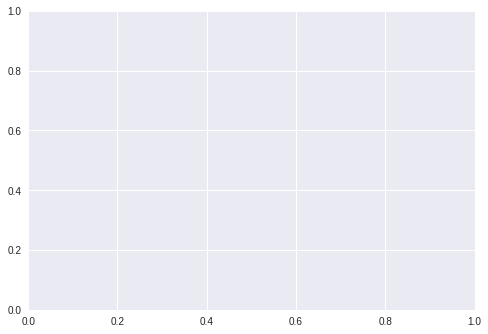

In [0]:
for i, channel in zip(range(len(channels_names)), channels_names):
  
  start_time = 0
  end_time = 1800
  
  plt.plot(
      t[start_time * fs:end_time * fs],
      syg [i, start_time * fs:end_time * fs]
  )
  plt.title(channel)
  plt.xlabel('czas [s]')
  plt.show()

### Detect artifacts

In [0]:
def calcERP(signals, time_pre, time_post, channels_names):
  assert time_pre < time_post, 'time_pre must be smaller than time_post.'
  
  number_of_points = int((time_post - time_pre) * fs)
  
  ERP_signal = np.zeros((signals[0].shape[0], number_of_points))

  for sig in signals:
    ERP_signal += sig
    
  ERP_signal /= len(signals)
  
  t = np.arange(time_pre, time_post, 1/fs)[:-1]
  return t, ERP_signal

def find_indexes(x, diod_channel_name, channels_names, time_pre, time_post, threshold, ):
  diod = x[channels_names.index(diod_channel_name)]

  binary_mask = np.less(diod,np.mean(diod))

  indexes = [i for i in range(len(binary_mask)-1) if binary_mask[i] == 0 and binary_mask[i+1] == 1]

  minus_delta, plus_delta = int(time_pre*fs), int(time_post*fs)
  indexes_boundaries = [(i+minus_delta, i + plus_delta + 1) for i in indexes]

  indexes_filterd = []
  removed = []
  Fp1_index = channels_names.index('Fp1')
  for i, index in  enumerate(indexes):
    bound_low, bound_high = indexes_boundaries[i] 
 
    s = x[Fp1_index, bound_low:bound_high+1]

    s_min, s_max = np.min(s), np.max(s)
    
    boundaries = (bound_low, bound_high)
    if s_min > -threshold and s_max < threshold:
      indexes_filterd.append(boundaries)


  print('left =', len(indexes_filterd))
  return indexes_filterd

def _cut_signal(indexes, x, cut_last_channels):
  min_index, max_index = indexes
  return x[:x.shape[0]-cut_last_channels,min_index : max_index]

def cut_signal(x,
               diod_channel_name,
               channels_names,
               time_pre=-0.3, 
               time_post=0.4,
               threshold=75,
               cut_last_channels=0,
              ):
  
  indexes = find_indexes(x, diod_channel_name, channels_names, time_pre, time_post, threshold)
  
  signals = []
  
  for i in indexes:
    signals.append(_cut_signal(i,x,cut_last_channels))
  return signals

def ERP(x,
        diod_channel_name,
        channels_names,
        threshold=75, 
        fs=512, 
        time_pre=-0.3, 
        time_post=0.4,
        cut_last_channels=0,
        ):
  
#   indexes_filterd = find_indexes(x, diod_channel_name, channels_names, time_pre, time_post, threshold)
  
  signals =  cut_signal(x, diod_channel_name, channels_names, time_pre, time_post, threshold, cut_last_channels)

  t, _erp = calcERP(signals, time_pre, time_post, channels_names)
  return t, _erp

In [0]:
t_test,erp_test = ERP(syg_1, 'd2', channels_names=channels_names, cut_last_channels=3)

NameError: ignored

In [0]:
plt.figure(figsize=(20,10))
for k in range(erp_test.shape[0]):
  t,x = t_test, erp_test[k]
  if np.min(x) > 75 or np.min(x) < -75:
    continue
  plt.plot(t_test, erp_test[k], label=channels_names[k], )
plt.xscale('log')
plt.legend()
plt.show()

NameError: ignored

### Differences in P2 amplitude

In [0]:
def calculate_P2_amplitude(erp):
  low = int((0.11 + 0.3) * fs)
  high = int((0.22 + 0.3) * fs)

  _min = np.min(erp[low:high])

  index_min = np.where(erp[low:high] == _min)[0][0] 

  low += index_min

  _max = np.max(erp[low:high])

  return _max - _min

t, erps_1 = ERP(syg_1, 'fp1')

t, erps_2 = ERP(syg_2, 'fp1')

P2_I = calculate_P2_amplitude, erps_1[channels_names.index('O2')]

P2_II = calculate_P2_amplitude, erps_2[channels_names.index('O2')]

delta_P2 = P2_I - P2_II

TypeError: ignored

#### Permutation Test

In [0]:
def calculate_permute_diff(syg1, syg2):
  indexes = np.concatenate((syg1, syg2)) # [n, len(sygnalu)]

  np.random.shuffle(indexes)

  _syg1 = indexes[:len(syg1)]
  _syg2 = indexes[len(syg2):]
  
  erps_1 = calculate_erp(_syg1)
  erps_2 = calculate_erp(_syg2)
  
  P2_I = calculate_P2_amplitude(erps_1)
  P2_II = calculate_P2_amplitude(erps_2)
  
  return P2_I - P2_II

def make_test(syg1, syg2, N):
  
  return map(lambda _: calculate_permute_diff(syg1, syg2), range(N))

def calculate_p_value(permutations, test_subject):
  p_value = st.norm.cdf(test_subject, loc=np.mean(permutations), scale=np.std(permutations))
  p_value = p_value if p_value < 0.5 else 1 - p_value
  return p_value

def get_compononets(s):
  
  artefacts = find_artefacts_tags(s[channels_names.index('Fp1'), :])

  tags = diode_to_tags(s[channels_names.index('d2'), :])
  
  return populate_tags(tags, s, fs=fs)

def calculate_erp(s):
  return np.mean(s, axis=0)

def test_P2_for_channel(channel_name, N):
  
  _, s1 = get_compononets(syg_1)
  _, s2 = get_compononets(syg_2)
  
  s1 = s1[:, channels_names.index(channel_name), :]
  s2 = s2[:, channels_names.index(channel_name), :]
  
  permutations = list(make_test(s1, s2, N))
  
  _, erps_1 = get_compononets(syg_1)
  _, erps_2 = get_compononets(syg_2)
  
  erps_1 = calculate_erp(erps_1)[channels_names.index(channel_name), :]
  erps_2 = calculate_erp(erps_2)[channels_names.index(channel_name), :]


  P2_I = calculate_P2_amplitude(erps_1)
  P2_II = calculate_P2_amplitude(erps_2)

  delta = P2_I - P2_II
  
  sns.set_context('poster')
  plt.hist(permutations, bins=np.arange(-10, 10, 0.4), density=True, alpha=0.5)
  plt.axvline(delta, c='r')
  
  p_value = calculate_p_value(permutations, delta)

  return p_value

for channel in channels_names[:-3]:
  p_val = test_P2_for_channel(channel, 1000)
  plt.title(f'{channel}    {p_val:.2f}')
  plt.show()

## Wersja 2: Habituacja

### Read Data

#### Reading signals


In [0]:
filename = "p300_2"
site = 'http://studenci.fuw.edu.pl/~cp383253/cw2/'

extentions = ['.xml', '.raw', '.tag']

for ext in extentions:

  if os.path.isfile(filename+ext):
    pass
  else:
    www = os.path.join(site, filename+ext)
    os.system(f'wget {www}')

mgr = ReadManager("%s.xml"%filename, "%s.raw"%filename, "%s.tag"%filename)
fs = int(float(mgr.get_param("sampling_frequency")))
num_of_channels = int(mgr.get_param("number_of_channels"))
channels_names = mgr.get_param("channels_names")

raw_syg_3 = mgr.get_microvolt_samples()
t_3 = np.arange(raw_syg_3.shape[1])/fs

2018-11-15 12:49:43,389 - data_source - INFO - All data set requested for the first time. Start reading all data from the file...


#### Montage

In [0]:
montage_syg = np.copy(raw_syg_3)
montage_syg[:-3,:] -= (raw_syg_3[channels_names.index('TP9'),:] + raw_syg_3[channels_names.index('TP10'),:])/2

### Filtering

#### Define filter

In [0]:
def filter_data(data, fs):
  '''
  Filtering 0.1 - 20 Hz
  '''
  data = butter_lowpass_filter(data, 20, fs, order=2)

  data = butter_highpass_filter(data, 0.1, fs, order=2)

  data = notch_filter(data, 50, fs)

  return data

In [0]:
syg_3 = np.copy(montage_syg)

for channel in channels_names[:-3]:
  index = channels_names.index(channel)
  syg_3[index,:] = filter_data(syg_3[index,:], fs)

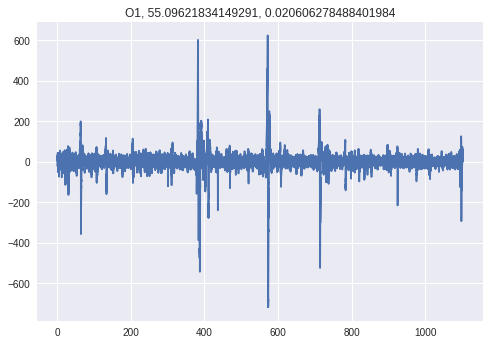

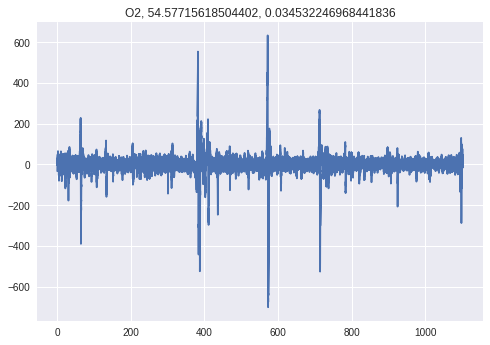

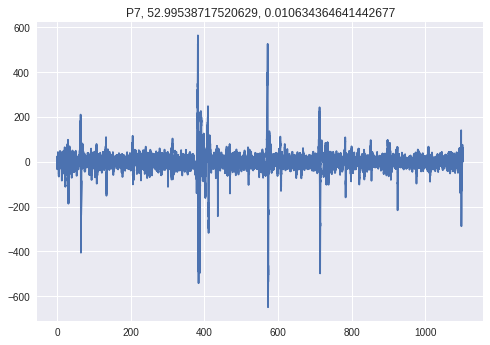

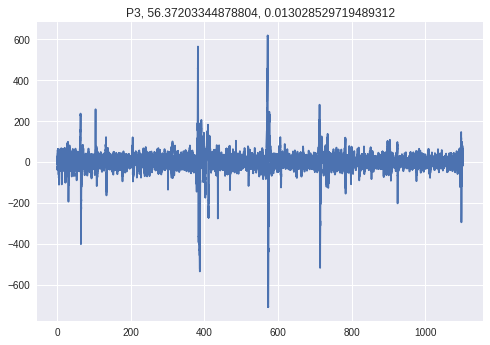

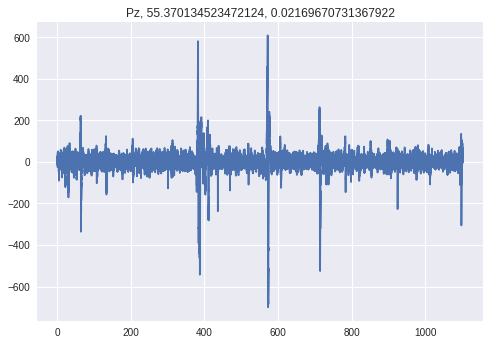

...

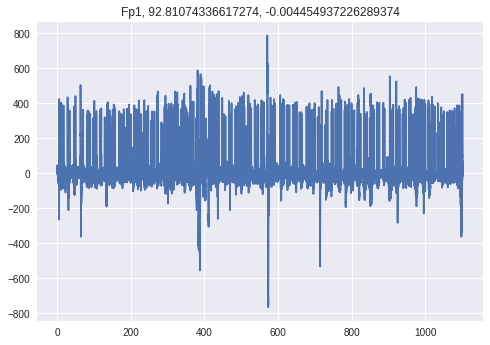

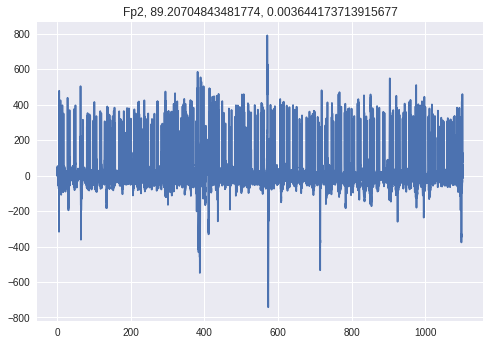

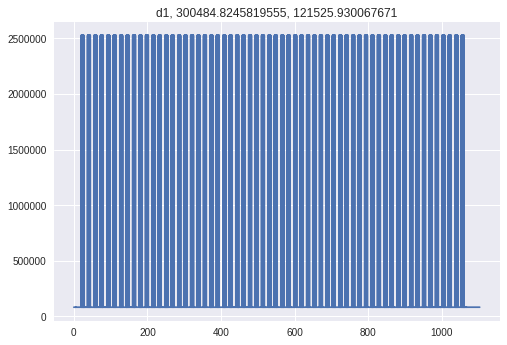

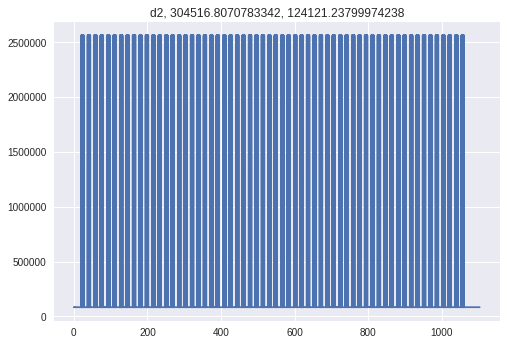

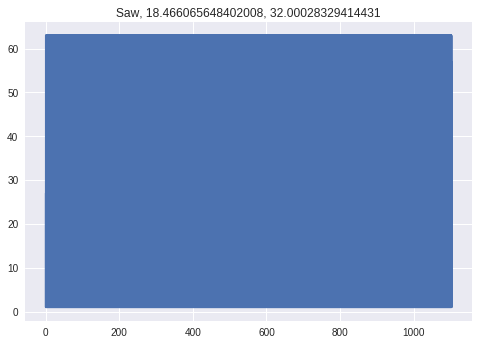

In [0]:
for i, channel in enumerate(channels_names):
  plt.plot(t_3, syg_3[i,:])
  plt.title(f'{channel}, {np.std(syg_3[i,:])}, {np.mean(syg_3[i,:])}')
  plt.show()

### Analysis

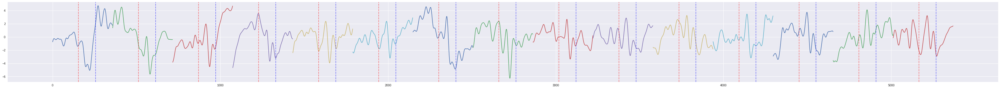

In [0]:
def get_populated_trials(syg, channel):
  artefacts = find_artefacts_tags(syg[channels_names.index('Fp1'), :])

  index = channels_names.index('d1')

  tags = diode_to_tags(syg[index, :])
  
  tags_for_trial = tags.reshape((tags.shape[0] // 15, 15)).T
  
  components = [populate_tags(tag, syg, artefacts, fs=fs) for tag in tags_for_trial]
  
  t = components[0][0]
  erp_components = np.array([component[1] for component in components])
  
  erps = np.array(list(map(lambda x: np.mean(x, axis=0), erp_components)))
  
  channel_index = channels_names.index(channel)
  
  num_of_points = len(erps[0, channel_index, :])
  x_axis = lambda i : np.arange(num_of_points * i, num_of_points * (i+1))
  
  for i in range(15): plt.plot(x_axis(i), erps[i, channel_index, :] - np.mean(erps[i, channel_index, :]))
  for i in range(15): plt.axvline(154 + num_of_points * i, c='r', ls='--', alpha=0.5)
  for i in range(15): plt.axvline(154 + int(0.2*fs) + num_of_points * i, c='b', ls='--', alpha=0.5)


plt.figure(figsize=(60, 5))
get_populated_trials(syg_3, 'O1')
plt.show()

In [0]:
get_populated_trials(syg_3)

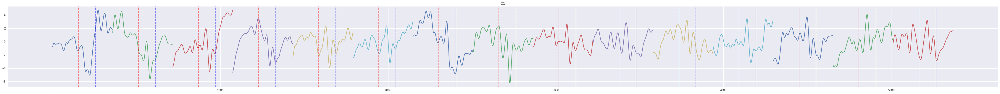

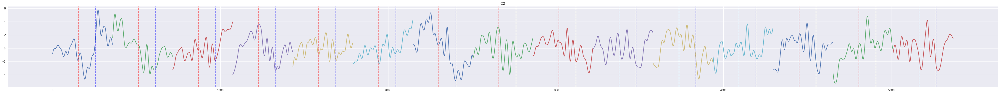

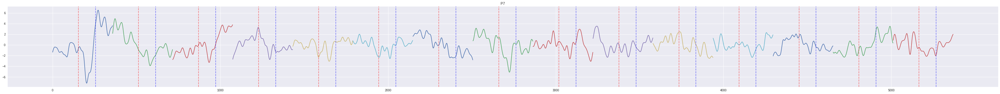

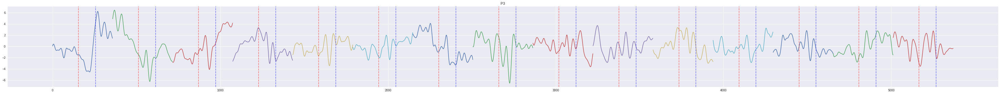

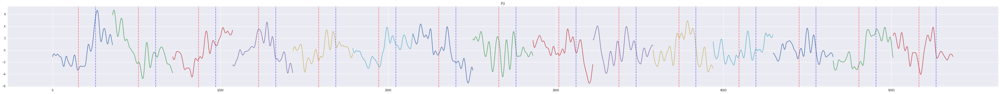

...

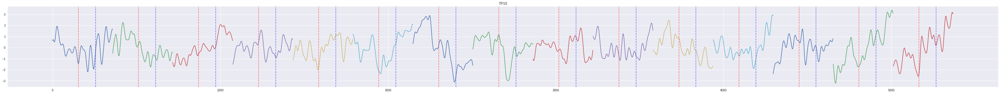

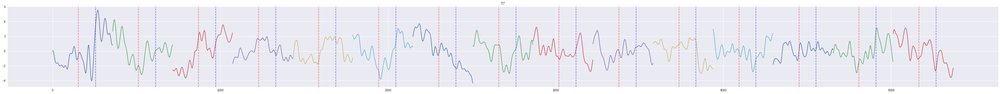

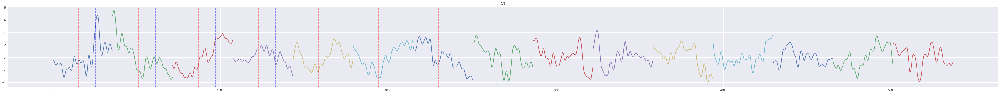

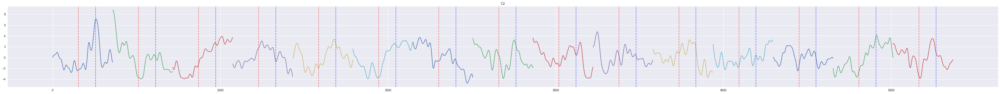

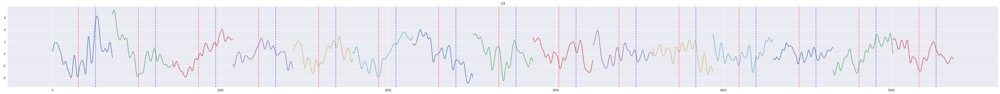

In [0]:
for c in channels_names[:-3]:
  plt.figure(figsize=(60, 5))
  get_populated_trials(syg_3, c)
  plt.title(c)
  plt.show()

In [0]:
O1_index


0

## Zadanie 3

### Read Data

#### Reading signals


In [0]:
filename = "p300_3-2"
site = 'http://studenci.fuw.edu.pl/~cp383253/cw2/'

extentions = ['.xml', '.raw', '.tag']

for ext in extentions:

  if os.path.isfile(filename+ext):
    pass
  else:
    www = os.path.join(site, filename+ext)
    os.system(f'wget {www}')

mgr = ReadManager("%s.xml"%filename, "%s.raw"%filename, "%s.tag"%filename)
fs = int(float(mgr.get_param("sampling_frequency")))
num_of_channels = int(mgr.get_param("number_of_channels"))
channels_names = mgr.get_param("channels_names")

raw_syg_4 = mgr.get_microvolt_samples()
t_4 = np.arange(raw_syg_4.shape[1])/fs

2018-11-15 13:55:52,535 - data_source - INFO - All data set requested for the first time. Start reading all data from the file...


#### Montage

In [0]:
montage_syg = np.copy(raw_syg_4)
montage_syg[:-3,:] -= (raw_syg_4[channels_names.index('TP9'),:] + raw_syg_4[channels_names.index('TP10'),:])/2

### Filtering

#### Define filter

In [0]:
def filter_data(data, fs):
  '''
  Filtering 0.1 - 20 Hz
  '''
  data = butter_lowpass_filter(data, 20, fs, order=2)

  data = butter_highpass_filter(data, 0.1, fs, order=2)

  data = notch_filter(data, 50, fs)

  return data

In [0]:
syg_4 = np.copy(montage_syg)

for channel in channels_names[:-3]:
  index = channels_names.index(channel)
  syg_4[index,:] = filter_data(syg_4[index,:], fs)

In [0]:
for i, channel in enumerate(channels_names):
  plt.plot(t_4, syg_4[i,:])
  plt.title(f'{channel}, {np.std(syg_4[i,:])}, {np.mean(syg_4[i,:])}')
  plt.show()

In [0]:
def compare_classes(syg, channel_index):
  artefacts = find_artefacts_tags(syg[channels_names.index('Fp1'), :])
  
  index_1 = channels_names.index('d1')
  tags_1 = diode_to_tags(syg[index_1, :])
  
  index_2 = channels_names.index('d2')
  tags_2_common = diode_to_tags(syg[index_2, :])

  tags_2_diff = np.array(list(set(tags_1) ^ set(tags_2_common)))
  
  t, class_1 = populate_tags(tags_1, syg, artefacts, fs=fs, low=-0.3, high=0.6)
  _, class_2 = populate_tags(tags_2_diff, syg, artefacts, fs=fs, low=-0.3, high=0.6)
  
  erp_1 = np.mean(class_1[:, channel_index, :], axis=0)
  erp_2 = np.mean(class_2[:, channel_index, :], axis=0)
  
  return t, erp_1, erp_2  

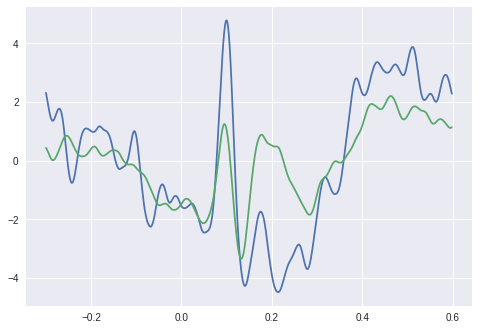

In [0]:
t, e_1, e_2 = compare_classes(syg_4, channels_names.index('O1'))

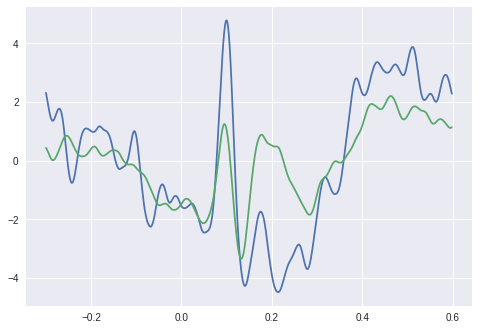

In [0]:
plt.plot(t, e_1 - np.mean(e_1))
plt.plot(t, e_2 - np.mean(e_2))
plt.show()

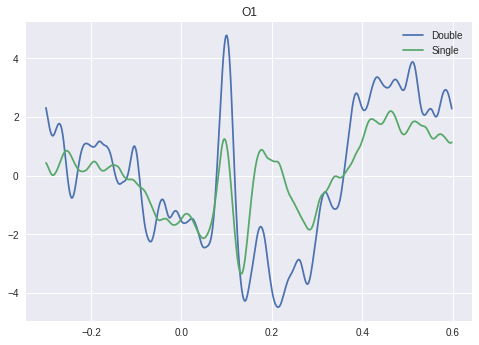

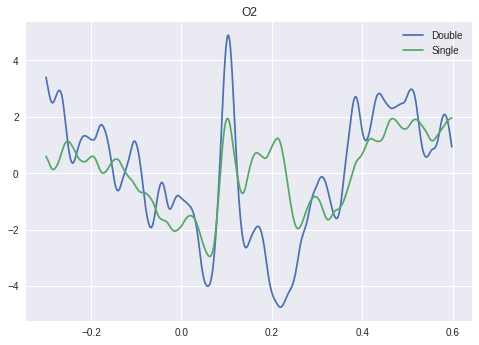

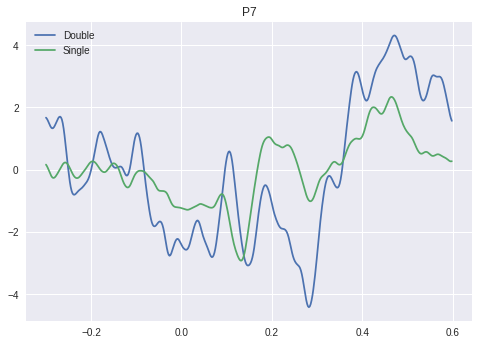

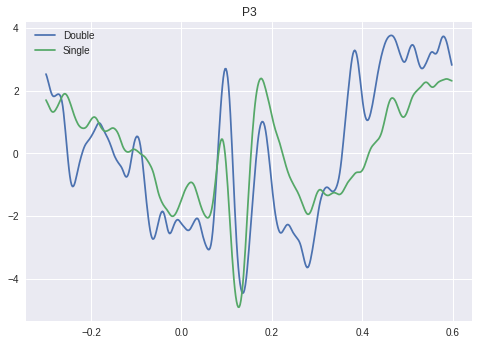

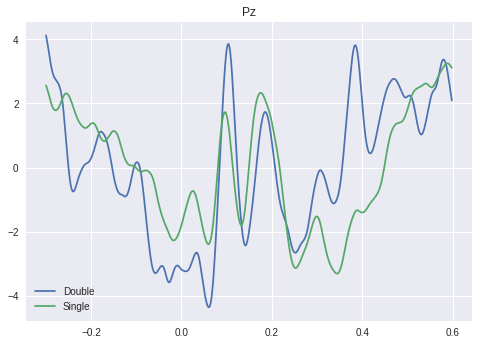

...

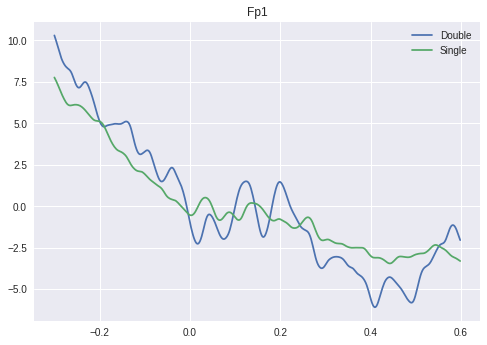

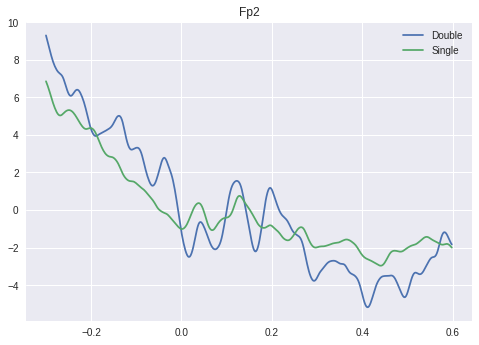

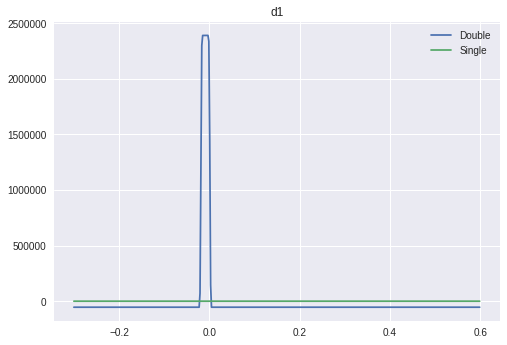

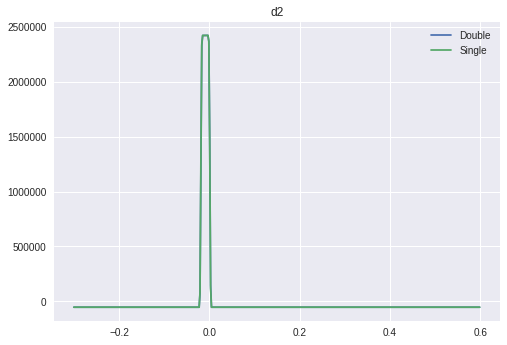

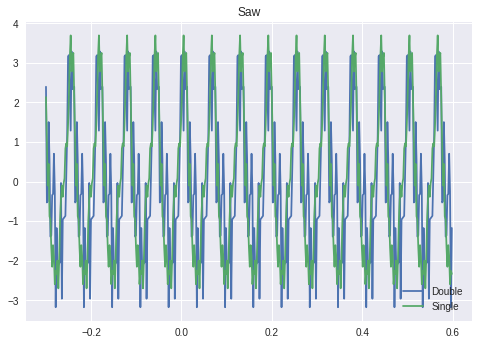

In [0]:
for i, channel in enumerate(channels_names):
  t, e1, e2 = compare_classes(syg_4, channels_names.index(channel))
  plt.plot(t, e1-np.mean(e1), label='Double')
  plt.plot(t, e2-np.mean(e2), label='Single')
  plt.title(f'{channel}')
  plt.legend()
  plt.show()